In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/previous-seasons/previous_seasons.csv
/kaggle/input/fantasy-football/master_team_list.csv
/kaggle/input/fantasy-football/cleaned_merged_seasons.csv
/kaggle/input/arima-data/ARIMA_data.csv


In [2]:
df = pd.read_csv('/kaggle/input/fantasy-football/cleaned_merged_seasons.csv')
df

/tmp/ipykernel_32/2351316577.py:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/kaggle/input/fantasy-football/cleaned_merged_seasons.csv')


,season_x,name,position,team_x,assists,bonus,bps,clean_sheets,creativity,element,...,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW
0,2016-17,Aaron Cresswell,DEF,NaN,0,0,0,0,0.0,454,...,2.0,0.0,0,0,0,0,55,False,0,1
1,2016-17,Aaron Lennon,MID,NaN,0,0,6,0,0.3,142,...,1.0,0.0,1,0,0,0,60,True,0,1
2,2016-17,Aaron Ramsey,MID,NaN,0,0,5,0,4.9,16,...,3.0,23.0,2,0,0,0,80,True,0,1
3,2016-17,Abdoulaye Doucouré,MID,NaN,0,0,0,0,0.0,482,...,1.0,0.0,0,0,0,0,50,False,0,1
4,2016-17,Adam Forshaw,MID,NaN,0,0,3,0,1.3,286,...,1.0,0.0,1,0,0,0,45,True,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96164,2022-23,Oliver Skipp,MID,Spurs,0,0,16,0,0.0,441,...,1.0,0.0,2,100,742,642,43,False,0,38
96165,2022-23,Ryan Sessegnon,DEF,Spurs,0,0,0,0,0.0,436,...,1.0,0.0,0,-166,24,190,44,False,0,38
96166,2022-23,Ashley Young,DEF,Aston Villa,0,0,0,0,0.0,538,...,2.0,0.0,0,-1146,1522,2668,43,True,0,38
96167,2022-23,Jeremy Sarmiento Morante,MID,Brighton,0,0,0,0,0.0,119,...,2.0,0.0,0,-17,22,39,45,False,0,38


In [16]:
df_22_23 = df[df['season_x'] == "2022-23"]
df_22_23

,season_x,name,position,team_x,assists,bonus,bps,clean_sheets,creativity,element,...,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW
69664,2022-23,Nathan Redmond,MID,Southampton,0,0,3,0,0.0,403,...,4.0,0.0,1,0,0,0,55,False,0,1
69665,2022-23,Junior Stanislas,MID,Bournemouth,0,0,3,0,0.0,58,...,2.0,0.0,1,0,0,0,50,True,0,1
69666,2022-23,Armando Broja,FWD,Chelsea,0,0,3,0,0.3,150,...,0.0,19.0,1,0,0,0,55,False,0,1
69667,2022-23,Fabian Schär,DEF,Newcastle,0,3,43,1,14.6,366,...,2.0,25.0,15,0,0,0,45,True,0,1
69668,2022-23,Jonny Evans,DEF,Leicester,0,0,15,0,1.3,249,...,2.0,0.0,1,0,0,0,45,True,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96164,2022-23,Oliver Skipp,MID,Spurs,0,0,16,0,0.0,441,...,1.0,0.0,2,100,742,642,43,False,0,38
96165,2022-23,Ryan Sessegnon,DEF,Spurs,0,0,0,0,0.0,436,...,1.0,0.0,0,-166,24,190,44,False,0,38
96166,2022-23,Ashley Young,DEF,Aston Villa,0,0,0,0,0.0,538,...,2.0,0.0,0,-1146,1522,2668,43,True,0,38
96167,2022-23,Jeremy Sarmiento Morante,MID,Brighton,0,0,0,0,0.0,119,...,2.0,0.0,0,-17,22,39,45,False,0,38


In [17]:
df_22_23.sort_values(by = 'total_points') 

,season_x,name,position,team_x,assists,bonus,bps,clean_sheets,creativity,element,...,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW
71642,2022-23,Chris Mepham,DEF,Bournemouth,0,0,4,0,0.2,71,...,9.0,0.0,-4,-1054,241,1295,45,False,0,4
84846,2022-23,Nick Pope,GK,Newcastle,0,0,-7,0,0.0,376,...,0.0,0.0,-3,-54313,36269,90582,55,True,0,24
72645,2022-23,Luke Thomas,DEF,Leicester,0,0,4,0,1.3,270,...,5.0,0.0,-3,280,906,626,43,False,1,6
73628,2022-23,Nathan Collins,DEF,Wolves,0,0,-4,0,0.1,516,...,0.0,0.0,-3,33377,46670,13293,45,True,0,8
87634,2022-23,Matheus Luiz Nunes,MID,Wolves,0,0,-9,0,0.0,589,...,2.0,0.0,-3,-92,423,515,48,True,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74011,2022-23,Leandro Trossard,MID,Brighton,0,3,56,0,9.2,111,...,3.0,74.0,20,-4141,40507,44648,66,False,0,9
85846,2022-23,Mohamed Salah,MID,Liverpool,2,3,64,1,40.1,283,...,7.0,49.0,21,-309805,38157,347962,127,True,1,26
93146,2022-23,Dwight McNeil,MID,Everton,2,3,76,0,31.3,534,...,1.0,78.0,21,-193,1460,1653,51,False,0,35
71648,2022-23,Roberto Firmino,FWD,Liverpool,3,3,81,1,49.8,279,...,9.0,128.0,22,5406,23967,18561,80,True,0,4


In [18]:
list(df.columns)

['season_x',
 'name',
 'position',
 'team_x',
 'assists',
 'bonus',
 'bps',
 'clean_sheets',
 'creativity',
 'element',
 'fixture',
 'goals_conceded',
 'goals_scored',
 'ict_index',
 'influence',
 'kickoff_time',
 'minutes',
 'opponent_team',
 'opp_team_name',
 'own_goals',
 'penalties_missed',
 'penalties_saved',
 'red_cards',
 'round',
 'saves',
 'selected',
 'team_a_score',
 'team_h_score',
 'threat',
 'total_points',
 'transfers_balance',
 'transfers_in',
 'transfers_out',
 'value',
 'was_home',
 'yellow_cards',
 'GW']

In [19]:
df.dtypes

season_x              object
name                  object
position              object
team_x                object
assists                int64
bonus                  int64
bps                    int64
clean_sheets           int64
creativity           float64
element                int64
fixture                int64
goals_conceded         int64
goals_scored           int64
ict_index            float64
influence            float64
kickoff_time          object
minutes                int64
opponent_team          int64
opp_team_name         object
own_goals              int64
penalties_missed       int64
penalties_saved        int64
red_cards              int64
round                  int64
saves                  int64
selected               int64
team_a_score         float64
team_h_score         float64
threat               float64
total_points           int64
transfers_balance      int64
transfers_in           int64
transfers_out          int64
value                  int64
was_home      

In [20]:
stats_col = ['assists', 'bonus', 'clean_sheets', 'goals_conceded', 'goals_scored', 'minutes', 'own_goals',
             'penalties_missed', 'penalties_saved', 'red_cards', 'saves', 'selected', 'team_a_score', 'team_h_score', 
             'total_points', 'value', 'yellow_cards',]
id_col = ['name', 'position', 'element']

In [21]:
s_df = df.astype(str)
s_df

,season_x,name,position,team_x,assists,bonus,bps,clean_sheets,creativity,element,...,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW
0,2016-17,Aaron Cresswell,DEF,nan,0,0,0,0,0.0,454,...,2.0,0.0,0,0,0,0,55,False,0,1
1,2016-17,Aaron Lennon,MID,nan,0,0,6,0,0.3,142,...,1.0,0.0,1,0,0,0,60,True,0,1
2,2016-17,Aaron Ramsey,MID,nan,0,0,5,0,4.9,16,...,3.0,23.0,2,0,0,0,80,True,0,1
3,2016-17,Abdoulaye Doucouré,MID,nan,0,0,0,0,0.0,482,...,1.0,0.0,0,0,0,0,50,False,0,1
4,2016-17,Adam Forshaw,MID,nan,0,0,3,0,1.3,286,...,1.0,0.0,1,0,0,0,45,True,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96164,2022-23,Oliver Skipp,MID,Spurs,0,0,16,0,0.0,441,...,1.0,0.0,2,100,742,642,43,False,0,38
96165,2022-23,Ryan Sessegnon,DEF,Spurs,0,0,0,0,0.0,436,...,1.0,0.0,0,-166,24,190,44,False,0,38
96166,2022-23,Ashley Young,DEF,Aston Villa,0,0,0,0,0.0,538,...,2.0,0.0,0,-1146,1522,2668,43,True,0,38
96167,2022-23,Jeremy Sarmiento Morante,MID,Brighton,0,0,0,0,0.0,119,...,2.0,0.0,0,-17,22,39,45,False,0,38


In [22]:
team_df = pd.read_csv('/kaggle/input/fantasy-football/master_team_list.csv')
team_df

,season,team,team_name
0,2016-17,1,Arsenal
1,2016-17,2,Bournemouth
2,2016-17,3,Burnley
3,2016-17,4,Chelsea
4,2016-17,5,Crystal Palace
...,...,...,...
135,2022-23,16,Nott'm Forest
136,2022-23,17,Southampton
137,2022-23,18,Spurs
138,2022-23,19,West Ham


In [27]:
# team_h = "Chelsea"
team_a = "Newcastle"
match_df = s_df[(s_df['was_home'] == "True") & (s_df["opp_team_name"] == team_a)]
match_df.sort_values(by = "total_points")

,season_x,name,position,team_x,assists,bonus,bps,clean_sheets,creativity,element,...,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW
88971,2022-23,Emerson Palmieri dos Santos,DEF,West Ham,0,0,6,0,3.1,545,...,1.0,0.0,-1,-1315,8383,9698,40,True,1,29
10149,2017-18,Jonny Evans,DEF,nan,0,0,12,0,1.0,423,...,2.0,0.0,-1,728,1833,1105,49,True,0,14
50365,2021-22,Robert Sánchez,GK,Brighton,0,0,1,0,10.0,69,...,1.0,0.0,-1,7231,38299,31068,46,True,0,11
60300,2021-22,Pelenda Joshua Dasilva,MID,Brentford,0,0,-7,0,0.7,82,...,0.0,0.0,-2,67,102,35,53,True,0,27
94008,2022-23,Junior Firpo Adames,DEF,Leeds,0,0,-8,0,1.2,239,...,2.0,2.0,-2,494,955,461,45,True,0,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45988,2021-22,Paul Pogba,MID,Man Utd,2,2,36,0,42.8,272,...,4.0,2.0,9,-50796,266272,317068,77,True,1,4
29803,2020-21,Aaron Ramsdale,GK,Sheffield Utd,0,2,28,1,0.0,483,...,1.0,0.0,9,2975,13461,10486,47,True,0,18
29575,2020-21,Ethan Ampadu,DEF,Sheffield Utd,0,3,32,1,28.1,509,...,1.0,2.0,9,2359,5250,2891,43,True,0,18
9050,2017-18,Nick Pope,GK,nan,0,2,31,1,0.0,469,...,1.0,0.0,9,22934,26470,3536,45,True,0,10


In [28]:
for c in stats_col:
    match_df[c] = match_df[c].astype(float)
match_df = match_df.loc[:,id_col+stats_col]
match_df['element'] = match_df['element'].astype(float)

/tmp/ipykernel_33/2477802946.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_df[c] = match_df[c].astype(float)
/tmp/ipykernel_33/2477802946.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_df[c] = match_df[c].astype(float)
/tmp/ipykernel_33/2477802946.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

In [29]:
match_df

,name,position,element,assists,bonus,clean_sheets,goals_conceded,goals_scored,minutes,own_goals,penalties_missed,penalties_saved,red_cards,saves,selected,team_a_score,team_h_score,total_points,value,yellow_cards
8865,Ashley Barnes,FWD,93.0,0.0,0.0,1.0,0.0,0.0,90.0,0.0,0.0,0.0,0.0,0.0,18272.0,0.0,1.0,2.0,52.0,0.0
8867,Ashley Westwood,MID,88.0,0.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,6677.0,0.0,1.0,1.0,44.0,0.0
8876,Ben Mee,DEF,77.0,0.0,3.0,1.0,0.0,0.0,90.0,0.0,0.0,0.0,0.0,0.0,368283.0,0.0,1.0,9.0,45.0,0.0
8883,Charlie Taylor,DEF,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9132.0,0.0,1.0,0.0,43.0,0.0
8891,Chris Wood,FWD,518.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,98117.0,0.0,1.0,0.0,65.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96051,César Azpilicueta,DEF,127.0,0.0,0.0,0.0,1.0,0.0,90.0,0.0,0.0,0.0,0.0,0.0,134109.0,1.0,1.0,2.0,47.0,0.0
96062,Callum Hudson-Odoi,MID,144.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3591.0,1.0,1.0,0.0,53.0,0.0
96075,Raheem Sterling,MID,304.0,1.0,0.0,0.0,1.0,0.0,90.0,0.0,0.0,0.0,0.0,0.0,392625.0,1.0,1.0,5.0,97.0,0.0
96078,Christian Pulisic,MID,140.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,51323.0,1.0,1.0,1.0,56.0,0.0


In [30]:
perf_M = match_df[match_df['position'] == 'MID']
perf_M = perf_M.drop(columns = ['position']).groupby('name', as_index = False).mean()
perf_M.sort_values(by= ['total_points', 'value'], ascending = False)

,name,element,assists,bonus,clean_sheets,goals_conceded,goals_scored,minutes,own_goals,penalties_missed,penalties_saved,red_cards,saves,selected,team_a_score,team_h_score,total_points,value,yellow_cards
385,Pierre-Emerick Aubameyang,4.000000,0.000000,2.0,1.000000,0.000000,2.000000,78.000000,0.0,0.0,0.0,0.000000,0.0,5.395550e+05,0.000000,3.000000,15.000000,113.000000,0.0
65,Bruno Miguel Borges Fernandes,289.500000,0.500000,2.0,0.000000,1.000000,1.000000,87.000000,0.0,0.0,0.0,0.000000,0.0,4.066282e+06,1.000000,3.500000,10.000000,118.000000,0.5
411,Rúben da Silva Neves,480.000000,0.000000,3.0,0.000000,1.000000,1.000000,90.000000,0.0,0.0,0.0,0.000000,0.0,1.497050e+05,1.000000,1.000000,10.000000,55.000000,0.0
269,Leandro Trossard,81.333333,0.333333,2.0,0.666667,0.333333,0.666667,80.666667,0.0,0.0,0.0,0.000000,0.0,2.608237e+05,0.333333,1.333333,9.000000,62.333333,0.0
173,Ismaila Sarr,399.000000,0.000000,2.0,0.000000,1.000000,1.000000,90.000000,0.0,0.0,0.0,0.000000,0.0,1.099120e+06,1.000000,1.000000,9.000000,62.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,Malcolm Ebiowei,173.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,3.997200e+04,0.000000,0.000000,0.000000,42.000000,0.0
364,Omari Hutchinson,653.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,8.970000e+02,1.000000,1.000000,0.000000,42.000000,0.0
176,Jack Colback,381.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,8.622800e+04,2.000000,1.000000,0.000000,41.000000,0.0
351,Nathaniel Chalobah,233.333333,0.000000,0.0,0.000000,1.333333,0.000000,2.333333,0.0,0.0,0.0,0.333333,0.0,2.063933e+04,2.000000,1.333333,-0.666667,45.333333,0.0


In [ ]:
# Get Previous Years data through github dynamically

In [2]:
years = ["2020-21", "2021-22", "2022-23"]
previous_years = ["2019-20", "2020-21", "2021-22"]
gws = [f"gw{i}" for i in range(1, 39)]

In [3]:
seasons=["2020-21","2021-22","2022-23"]
unused_columns=["xP","opponent_team","expected_assists","expected_goal_involvements","expected_goals",
                "expected_goals_conceded","element_type_ex","team_h_score","team_a_score","element" , "round" ,"fixture","starts" ]
#stats that you want to use their values for the last few games to predict a

no_last_stats=3 #number of last gameweek stats to use for prediction

history_stats=["assists","bonus","bps","clean_sheets","creativity","goals_conceded","goals_scored","ict_index","influence","minutes",
               "own_goals","penalties_missed","penalties_saved","red_cards","saves","selected","threat","total_points","transfers_in","transfers_out","value","match_result","team Goal scored","team Goal conceded"]

last_features=[f"last {no_last_stats} {stat}" for stat in history_stats]

mean_features=["assists","bonus","bps","clean_sheets","creativity","goals_conceded",
     "goals_scored","ict_index","influence","minutes"
     ,"own_goals","penalties_missed","penalties_saved",
     "red_cards","saves","selected","threat","total_points"
     ,"transfers_in","transfers_out","value","match_result","team Goal scored","team Goal conceded"]

std_features=["bps","creativity","ict_index","influence","minutes","selected","threat","total_points","transfers_in","transfers_out","value"]



dropped_columns = [
    "season",
    "opponent",
    "match_result",
    "position",
    "assists",
    "penalties_missed",
    "bonus",
    "bps",
    "clean_sheets",
    "creativity",
    "goals_conceded",
    "goals_scored",
    "ict_index",
    "influence",
    "own_goals",
    "penalties_saved",
    "red_cards",
    "saves",
    "selected",
    "threat",
    "transfers_balance",
    "transfers_in",
    "transfers_out",
    "yellow_cards"
]  # "value",



leak_columns = [
    "name",
    "team",
]  # columns that shouldnt be used in training fir fear of data leakage



short_term_stats=3

team_features=["team Goal scored","team Goal conceded"]

In [4]:
import numpy as np
import pandas as pd
from scipy import stats


def split_test(data, gameweek):
    # print(data["GW"].value_counts())
    data_gw = data[data["GW"] == gameweek]
    data_other_gw = data[~(data["GW"] == gameweek)]
    return data_gw, data_other_gw


def check_win(df):
    list_win = []
    for index in df.index:
        result = (df["team_a_score"] - df["team_h_score"]).loc[index]
        is_home = df["was_home"].loc[index]
        if result == 0:
            list_win.append(1)
        elif result > 0 and is_home == True:
            list_win.append(0)
        elif result < 0 and is_home == True:
            list_win.append(3)
        elif result > 0 and is_home == False:
            list_win.append(3)
        elif result < 0 and is_home == False:
            list_win.append(0)
        else:
            list_win.append(-1)
    return list_win


def get_2020_21_season_pos(club):
    """get the position of the club in the 2020-21 season"""
    if club == "Man City":
        return 1
    elif club == "Man Utd":
        return 2
    elif club == "Liverpool":
        return 3
    elif club == "Chelsea":
        return 4
    elif club == "Leicester":
        return 5
    elif club == "West Ham":
        return 6
    elif club == "Spurs":
        return 7
    elif club == "Arsenal":
        return 8
    elif club == "Leeds":
        return 9
    elif club == "Everton":
        return 10
    elif club == "Aston Villa":
        return 11
    elif club == "Newcastle":
        return 12
    elif club == "Wolves":
        return 13
    elif club == "Crystal Palace":
        return 14
    elif club == "Southampton":
        return 15
    elif club == "Brighton":
        return 16
    elif club == "Burnley":
        return 17
    else:
        return 20


def get_2019_20_season_pos(club):
    """get the position of the club in the 2019-20 season"""
    if club == "Liverpool":
        return 1
    elif club == "Man City":
        return 2
    elif club == "Man Utd":
        return 3
    elif club == "Chelsea":
        return 4
    elif club == "Leicester":
        return 5
    elif club == "Spurs":
        return 6
    elif club == "Wolves":
        return 7
    elif club == "Arsenal":
        return 8
    elif club == "Sheffield Utd":
        return 9
    elif club == "Burnley":
        return 10
    elif club == "Southampton":
        return 11
    elif club == "Everton":
        return 12
    elif club == "Newcastle":
        return 13
    elif club == "Crystal Palace":
        return 14
    elif club == "Brighton":
        return 15
    elif club == "West Ham":
        return 16
    elif club == "Aston Villa":
        return 17
    else:
        return 20


def get_2021_22_season_pos(club):
    if club == "Man City":
        return 1
    elif club == "Liverpool":
        return 2
    elif club == "Chelsea":
        return 3
    elif club == "Spurs":
        return 4
    elif club == "Arsenal":
        return 5
    elif club == "Man Utd":
        return 6
    elif club == "West Ham":
        return 7
    elif club == "Leicester":
        return 8
    elif club == "Brighton":
        return 9
    elif club == "Wolves":
        return 10
    elif club == "Newcastle":
        return 11
    elif club == "Crystal Palace":
        return 12
    elif club == "Brentford":
        return 13
    elif club == "Aston Villa":
        return 14
    elif club == "Southampton":
        return 15
    elif club == "Everton":
        return 16
    elif club == "Leeds":
        return 17
    else:
        return 20


def get_2022_23_season_pos(club):
    if club == "Man City":
        return 1
    elif club == "Arsenal":
        return 2
    elif club == "Man Utd":
        return 3
    elif club == "Newcastle":
        return 4
    elif club == "Liverpool":
        return 5
    elif club == "Brighton":
        return 6
    elif club == "Aston Villa":
        return 7
    elif club == "Spurs":
        return 8
    elif club == "Brentford":
        return 9
    elif club == "Fulham":
        return 10
    elif club == "Crystal Palace":
        return 11
    elif club == "Chelsea":
        return 12
    elif club == "Wolves":
        return 13
    elif club == "West Ham":
        return 14
    elif club == "Bournemouth":
        return 15
    elif club == "Nott'm Forest":
        return 16
    elif club == "Everton":
        return 17
    else:
        return 20


def get_last_season_pos(year):
    """get the function to get the last season position of a team at any year"""
    if year == "2020-21":
        return get_2019_20_season_pos
    elif year == "2021-22":
        return get_2020_21_season_pos
    elif year == "2022-23":
        return get_2021_22_season_pos
    elif year == "2023-24":
        return get_2022_23_season_pos


def remove_neg(val):
    if val > 0:
        return val
    else:
        return -val


def deque_and_queue(stats, value):
    # if -1 in stats:
    #  return stats
    # deque
    stats = stats[1:]
    stats.append(value)
    return stats

def get_all_stats(data, stat, name):
    '''All stats for a player'''
    name_df = data[data["name"] == name]
    seasons = ["2020-21", "2021-22", "2022-23"]
    name_df_dict = {}
    for season in seasons:
        name_df_season = name_df[name_df["season"] == season]
        list_stats = []
        stats_x = []
        for value in name_df_season[stat]:
          list_stats.append(np.array(stats_x))
          stats_x.append(value)


        name_df_season[f"all {stat}"] = list_stats
        name_df_dict[season] = name_df_season
    return pd.concat(name_df_dict.values())


def get_last_stats(data, stat, name, no_last_stats=short_term_stats):
    '''Get last n week stats for specific player'''
    name_df = data[data["name"] == name]
    seasons = ["2020-21", "2021-22", "2022-23"]
    name_df_dict = {}
    for season in seasons:
        name_df_season = name_df[name_df["season"] == season]
        list_stats = []
        stats_x = []
        for value in name_df_season[stat]:
            if len(stats_x) < no_last_stats:
                list_stats.append(np.array(stats_x))
                stats_x.append(value)
            else:
                list_stats.append(np.array(stats_x))
                stats_x = deque_and_queue(stats_x, value)
        name_df_season[f"last {no_last_stats} {stat}"] = list_stats
        name_df_dict[season] = name_df_season
    return pd.concat(name_df_dict.values())


def get_all_players_last_stats(data, stat, no_last_stats=short_term_stats):
    '''Get last n week stats for all players'''
    players_df = []
    for player in data["name"].unique():
        data_player = get_last_stats(data, stat, player, no_last_stats)
        players_df.append(data_player)
    # print(pd.concat(players_df))
    return pd.concat(players_df)

def get_all_players_all_stats(data, stat):
    '''Get all stats for all players'''
    players_df = []
    for player in data["name"].unique():
        data_player =  get_all_stats(data, stat, player)
        players_df.append(data_player)
    # print(pd.concat(players_df))
    return pd.concat(players_df)

def get_last_stats_test(data, stat, name, no_last_stats=short_term_stats):
    '''Get last n week stats for specific players'''
    name_df = data[data["name"] == name]
    list_stats = []
    stats_x = []
    for value in name_df[stat]:
        if len(stats_x) < no_last_stats:
            list_stats.append(np.array(stats_x))
            stats_x.append(value)
        else:
            list_stats.append(np.array(stats_x))
            stats_x = deque_and_queue(stats_x, value)
    name_df[f"last {no_last_stats} {stat}"] = list_stats
    return name_df


def get_players_last_stats_test(data, stat, no_last_stats=short_term_stats):
    '''Get last n week stats for all players'''
    players_df = []
    for player in data["name"].unique():
        data_player = get_last_stats_test(data, stat, player, no_last_stats)
        players_df.append(data_player)
    # print(pd.concat(players_df))
    return pd.concat(players_df)

def get_all_stats_test(data, stat, name):
    '''Get all stats for specific player'''
    name_df = data[data["name"] == name]
    list_stats = []
    stats_x = []
    for value in name_df[stat]:
        list_stats.append(np.array(stats_x))
        stats_x.append(value)
    name_df[f"all {stat}"] = list_stats
    return name_df


def get_players_all_stats_test(data, stat):
    '''Get all stats for all player'''
    players_df = []
    for player in data["name"].unique():
        data_player = get_all_stats_test(data, stat, player)
        players_df.append(data_player)
    # print(pd.concat(players_df))
    return pd.concat(players_df)


def convert_minutes(val):
    """CONVERTS MINUTES TO A CATEGORICAL OUTPUT"""
    if val > 10:
        return 1
    else:
        return 0


def find_mode(vals):
    """find the mode of vals"""
    try:
        if -1 in vals:
            return -1
        return stats.mode(vals)[0][0]
    except IndexError:
        return np.nan


def find_mean(vals):
    """find the mean of vals"""
    try:
        if -1 in vals:
            return -1
        return np.mean(vals)
    except:
        return np.nan


def find_max(vals):
    """find the maximum of vals"""
    try:
        if -1 in vals:
            return -1
        return np.max(vals)
    except:
        return np.nan


def find_std(vals):
    """find the standard deviation of vals"""
    try:
        if -1 in vals:
            return -1
        return np.std(vals)
    except:
        return np.nan


def find_value_count(vals, to_count):
    """find the number of times to_count appears in vals"""
    try:
        if -1 in vals:
            return -1
        values, count = np.unique(vals, return_counts=True)
        index = np.where(values == to_count)[0][0]
        return count[index]

    except:
        return -2


def get_opp_team(data):
    """get the opponent team for each player"""
    opp_teams = []
    home_teams = data["home_team"]
    away_teams = data["away_team"]
    my_teams = data["team"]
    for id in data.index:
        my_team = my_teams.iloc[id]
        home_team = home_teams.iloc[id]
        away_team = away_teams.iloc[id]
        if my_team == home_team:
            opp_teams.append(away_team)
        else:
            opp_teams.append(home_team)
    return opp_teams




def create_features(data, mean_features, std_features):
    for mean_feature in mean_features:
        print(mean_feature)
        data[f"mean {mean_feature} {no_last_stats}"] = [
            find_mean(values) for values in data[f"last {no_last_stats} {mean_feature}"]
        ]
        data[f"mean {mean_feature} all"] = [
            find_mean(values) for values in data[f"all {mean_feature}"]
        ]
        #data[f"mean {mean_feature} all"]= data[f"mean {mean_feature} all"]/data["GW"]
    for std_feature in std_features:
        print(std_feature)
        data[f"std {std_feature} {no_last_stats}"] = [
            find_std(values) for values in data[f"last {no_last_stats} {std_feature}"]
        ]
    return data


#from config import unused_columns, history_stats, no_last_stats
import warnings

warnings.filterwarnings("ignore")


def calculate_ratio_team_value(name, df):
    """Calculate the ratio of player value to team value"""
    team = df[df["name"] == name]["team"].iloc[0]
    total_value = df[df["team"] == team]["value"].sum()
    value = df[df["name"] == name]["value"].iloc[0]
    return value * 100 / total_value


def calculate_position_rank(name, df):
    """Calculate the number of players with a higher value"""
    value = df[df["name"] == name]["value"].iloc[0]
    position = df[df["name"] == name]["position"].iloc[0]
    team = df[df["name"] == name]["team"].iloc[0]
    return df[
        (df["value"] > value) & (df["position"] == position) & (df["team"] == team)
    ]["value"].shape[0]



     

In [8]:
list_dfs = []

for i, year in enumerate(years):
    print(year)

    # get previous_seasons_data
    player_prev_stats = pd.read_csv(
        f"https://raw.githubusercontent.com/vaastav/Fantasy-Premier-League/master/data/{previous_years[i]}/cleaned_players.csv"
    )
    player_prev_stats["name"] = (
        player_prev_stats["first_name"] + " " + player_prev_stats["second_name"]
    )
    player_prev_stats.drop(["first_name", "second_name"], axis=1, inplace=True)
    player_prev_stats.columns = player_prev_stats.columns + "_ex"

    # get opponent_team
    teams = pd.read_csv(
        f"https://raw.githubusercontent.com/vaastav/Fantasy-Premier-League/master/data/{year}/teams.csv",
        encoding="latin-1",
    )[["id", "name"]]
    teams.columns = ["opponent_team", "opponent"]

    # opponents position last season
    teams["opponent_last_season_position"] = teams["opponent"].apply(
        get_last_season_pos(year)
    )
    for gameweek in range(1, 39):
        print(gameweek)
        df = pd.read_csv(
            f"https://raw.githubusercontent.com/vaastav/Fantasy-Premier-League/master/data/{year}/gws/gw{gameweek}.csv",
            encoding="latin-1",
        )

        # teams position last season
        df["last_season_position"] = df["team"].apply(get_last_season_pos(year))

        # calculate percentage value to team
        pv_list = []
        pr_list = []
        for name in df["name"]:
            pv_list.append(calculate_ratio_team_value(name, df))
            pr_list.append(calculate_position_rank(name, df))
        df["percent_value"] = pv_list
        df["position rank"] = pr_list

        # chek if the result was a win or not
        df["match_result"] = check_win(df)

        # merge previous_season_data
        df = pd.merge(
            df, player_prev_stats, left_on="name", right_on="name_ex", how="left"
        )
        df["season"] = year
        df.drop("name_ex", axis=1, inplace=True)
        df["GW"] = gameweek

        # merge opponent team
        df = pd.merge(df, teams, on="opponent_team", how="left")
        list_dfs.append(df)


all_data = pd.concat(list_dfs)
# all_data.to_csv("/kaggle/working/previous_seasons.csv")

2020-21
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
2021-22
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
2022-23
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38


In [6]:
all_data.to_csv("previous_seasons.csv")

In [6]:
all_data = pd.read_csv('/kaggle/input/previous-seasons/previous_seasons.csv')

In [7]:
all_data

,Unnamed: 0,name,position,team,xP,assists,bonus,bps,clean_sheets,creativity,...,season,GW,opponent,opponent_last_season_position,element_type_ex,expected_assists,expected_goal_involvements,expected_goals,expected_goals_conceded,starts
0,0,Aaron Connolly,FWD,Brighton,0.5,0,0,-3,0,0.3,...,2020-21,1,Chelsea,4,NaN,NaN,NaN,NaN,NaN,NaN
1,1,Aaron Cresswell,DEF,West Ham,2.1,0,0,11,0,11.2,...,2020-21,1,Newcastle,13,NaN,NaN,NaN,NaN,NaN,NaN
2,2,Aaron Mooy,MID,Brighton,0.0,0,0,0,0,0.0,...,2020-21,1,Chelsea,4,NaN,NaN,NaN,NaN,NaN,NaN
3,3,Aaron Ramsdale,GK,Sheffield Utd,2.5,0,0,12,0,0.0,...,2020-21,1,Wolves,7,NaN,NaN,NaN,NaN,NaN,NaN
4,4,Abdoulaye DoucourÃ©,MID,Everton,1.3,0,0,20,1,44.6,...,2020-21,1,Spurs,6,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76464,775,Oliver Skipp,MID,Spurs,2.0,0,0,16,0,0.0,...,2022-23,38,Leeds,17,MID,0.01,0.01,0.0,1.5,1.0
76465,776,Ryan Sessegnon,DEF,Spurs,0.0,0,0,0,0,0.0,...,2022-23,38,Leeds,17,DEF,0.00,0.00,0.0,0.0,0.0
76466,777,Ashley Young,DEF,Aston Villa,1.0,0,0,0,0,0.0,...,2022-23,38,Brighton,9,DEF,0.00,0.00,0.0,0.0,0.0
76467,778,Jeremy Sarmiento Morante,MID,Brighton,0.0,0,0,0,0,0.0,...,2022-23,38,Aston Villa,14,NaN,0.00,0.00,0.0,0.0,0.0


In [8]:
all_data = all_data.drop(columns = ['Unnamed: 0'])
all_data

,name,position,team,xP,assists,bonus,bps,clean_sheets,creativity,element,...,season,GW,opponent,opponent_last_season_position,element_type_ex,expected_assists,expected_goal_involvements,expected_goals,expected_goals_conceded,starts
0,Aaron Connolly,FWD,Brighton,0.5,0,0,-3,0,0.3,78,...,2020-21,1,Chelsea,4,NaN,NaN,NaN,NaN,NaN,NaN
1,Aaron Cresswell,DEF,West Ham,2.1,0,0,11,0,11.2,435,...,2020-21,1,Newcastle,13,NaN,NaN,NaN,NaN,NaN,NaN
2,Aaron Mooy,MID,Brighton,0.0,0,0,0,0,0.0,60,...,2020-21,1,Chelsea,4,NaN,NaN,NaN,NaN,NaN,NaN
3,Aaron Ramsdale,GK,Sheffield Utd,2.5,0,0,12,0,0.0,483,...,2020-21,1,Wolves,7,NaN,NaN,NaN,NaN,NaN,NaN
4,Abdoulaye DoucourÃ©,MID,Everton,1.3,0,0,20,1,44.6,512,...,2020-21,1,Spurs,6,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76464,Oliver Skipp,MID,Spurs,2.0,0,0,16,0,0.0,441,...,2022-23,38,Leeds,17,MID,0.01,0.01,0.0,1.5,1.0
76465,Ryan Sessegnon,DEF,Spurs,0.0,0,0,0,0,0.0,436,...,2022-23,38,Leeds,17,DEF,0.00,0.00,0.0,0.0,0.0
76466,Ashley Young,DEF,Aston Villa,1.0,0,0,0,0,0.0,538,...,2022-23,38,Brighton,9,DEF,0.00,0.00,0.0,0.0,0.0
76467,Jeremy Sarmiento Morante,MID,Brighton,0.0,0,0,0,0,0.0,119,...,2022-23,38,Aston Villa,14,NaN,0.00,0.00,0.0,0.0,0.0


In [12]:
all_data.columns

Index(['name', 'position', 'team', 'xP', 'assists', 'bonus', 'bps',
       'clean_sheets', 'creativity', 'element', 'fixture', 'goals_conceded',
       'goals_scored', 'ict_index', 'influence', 'kickoff_time', 'minutes',
       'opponent_team', 'own_goals', 'penalties_missed', 'penalties_saved',
       'red_cards', 'round', 'saves', 'selected', 'team_a_score',
       'team_h_score', 'threat', 'total_points', 'transfers_balance',
       'transfers_in', 'transfers_out', 'value', 'was_home', 'yellow_cards',
       'last_season_position', 'percent_value', 'position rank',
       'match_result', 'goals_scored_ex', 'assists_ex', 'total_points_ex',
       'minutes_ex', 'goals_conceded_ex', 'creativity_ex', 'influence_ex',
       'threat_ex', 'bonus_ex', 'bps_ex', 'ict_index_ex', 'clean_sheets_ex',
       'red_cards_ex', 'yellow_cards_ex', 'selected_by_percent_ex',
       'now_cost_ex', 'season', 'GW', 'opponent',
       'opponent_last_season_position', 'element_type_ex', 'expected_assists',
 

In [11]:
all_data["total_points"]

0        1
1        1
2        0
3        1
4        3
        ..
76464    2
76465    0
76466    0
76467    0
76468    2
Name: total_points, Length: 76469, dtype: int64

In [13]:
dummy = all_data.loc[:,["name", "position", "value","team", "percent_value", "position rank", "last_season_position", "total_points", "season", "GW"]]
dummy

,name,position,value,team,percent_value,position rank,last_season_position,total_points,season,GW
0,Aaron Connolly,FWD,55,Brighton,3.846154,1.0,15,1,2020-21,1
1,Aaron Cresswell,DEF,50,West Ham,3.787879,0.0,16,1,2020-21,1
2,Aaron Mooy,MID,50,Brighton,3.496503,6.0,15,0,2020-21,1
3,Aaron Ramsdale,GK,50,Sheffield Utd,4.115226,0.0,9,1,2020-21,1
4,Abdoulaye DoucourÃ©,MID,55,Everton,3.793103,5.0,12,3,2020-21,1
...,...,...,...,...,...,...,...,...,...,...
76464,Oliver Skipp,MID,43,Spurs,2.125556,15.0,4,2,2022-23,38
76465,Ryan Sessegnon,DEF,44,Spurs,2.174988,8.0,4,0,2022-23,38
76466,Ashley Young,DEF,43,Aston Villa,2.219928,7.0,14,0,2022-23,38
76467,Jeremy Sarmiento Morante,MID,45,Brighton,2.519597,7.0,9,0,2022-23,38


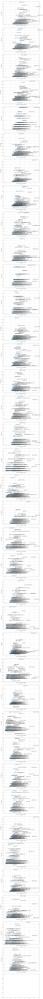

In [55]:
import matplotlib.pyplot as plt

dummy_22_23_MID  = dummy[(dummy['position'] == "MID") & (dummy['season'] == "2022-23")]

weeks = dummy_22_23_MID['GW'].unique()
num_weeks = 38
fig, axs = plt.subplots(num_weeks, 1, figsize=(10, 6 * num_weeks), sharex=True)
for i, week in enumerate(weeks):
    week_data = dummy_22_23_MID[dummy_22_23_MID['GW'] == week]
    axs[i].scatter(week_data['percent_value'], week_data['total_points'])
    axs[i].set_title(week)
    axs[i].set_xlabel('Player Cost in Team Percentage')
    axs[i].set_ylabel('Points Output')
    for j, player in enumerate(week_data['name']):
        axs[i].annotate(player, (week_data['percent_value'].iloc[j], week_data['total_points'].iloc[j]))
    axs[i].grid(True)
plt.tight_layout()
plt.show()


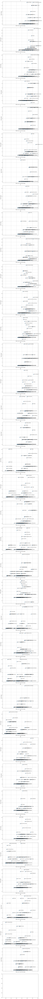

In [56]:
import matplotlib.pyplot as plt

dummy_22_23_MID  = dummy[(dummy['position'] == "GK") & (dummy['season'] == "2022-23")]

weeks = dummy_22_23_MID['GW'].unique()
num_weeks = 38
fig, axs = plt.subplots(num_weeks, 1, figsize=(10, 6 * num_weeks), sharex=True)
for i, week in enumerate(weeks):
    week_data = dummy_22_23_MID[dummy_22_23_MID['GW'] == week]
    axs[i].scatter(week_data['percent_value'], week_data['total_points'])
    axs[i].set_title(week)
    axs[i].set_xlabel('Player Cost in Team Percentage')
    axs[i].set_ylabel('Points Output')
    for j, player in enumerate(week_data['name']):
        axs[i].annotate(player, (week_data['percent_value'].iloc[j], week_data['total_points'].iloc[j]))
    axs[i].grid(True)
plt.tight_layout()
plt.show()


In [14]:
data = all_data
data_home=data[data["was_home"]==True]
data_away=data[data["was_home"]==False]
data_home["team Goal scored"]=data_home["team_h_score"]
data_home["team Goal conceded"]=data_home["team_a_score"]
data_away["team Goal conceded"]=data_away["team_h_score"]
data_away["team Goal scored"]=data_away["team_a_score"]
data=pd.concat([data_home,data_away])
#data["Goal_difference"]=data["team_h_score"]-data["team_a_score"]
data.drop(unused_columns,axis=1,inplace=True)

data["kickoff_time"]=pd.to_datetime(data["kickoff_time"])
print(data.shape)

data.drop_duplicates(["name","GW","season","team","opponent"],inplace=True)
print(data.shape)
data.sort_values(by="kickoff_time",inplace=True)


for stat in history_stats:
    print(stat)
    data=get_all_players_last_stats(data,stat)
    data=get_all_players_all_stats(data,stat)

data=create_features(data,mean_features,std_features)

data.drop([f"last {no_last_stats} {stat}" for stat in history_stats],axis=1,inplace=True)
data.drop([f"all {stat}" for stat in history_stats],axis=1,inplace=True)
data["ratio_goal_scored 3"]=((data["mean goals_scored 3"]/data["mean team Goal scored 3"]).replace(np.inf, 0))*100
data["ratio_goal_scored all"]=((data["mean goals_scored all"]/data["mean team Goal scored all"]).replace(np.inf, 0))*100
     

(76469, 54)
(76317, 54)
assists
bonus
bps
clean_sheets
creativity
goals_conceded
goals_scored
ict_index
influence
minutes
own_goals
penalties_missed
penalties_saved
red_cards
saves
selected
threat
total_points
transfers_in
transfers_out
value
match_result
team Goal scored
team Goal conceded
assists
bonus
bps
clean_sheets
creativity
goals_conceded
goals_scored
ict_index
influence
minutes
own_goals
penalties_missed
penalties_saved
red_cards
saves
selected
threat
total_points
transfers_in
transfers_out
value
match_result
team Goal scored
team Goal conceded
bps
creativity
ict_index
influence
minutes
selected
threat
total_points
transfers_in
transfers_out
value


In [17]:
ARIMA_data = data
ARIMA_data.to_csv("ARIMA_data.csv")

In [2]:
import pandas as pd
import numpy as np

In [7]:
ARIMA_data = pd.read_csv('/kaggle/input/arima-data/ARIMA_data.csv')
ARIMA_data = ARIMA_data.drop(columns = ['Unnamed: 0'])

In [9]:

ARIMA_data.shape

(76317, 115)

In [20]:
ARIMA_data

,name,position,team,assists,bonus,bps,clean_sheets,creativity,goals_conceded,goals_scored,...,std influence 3,std minutes 3,std selected 3,std threat 3,std total_points 3,std transfers_in 3,std transfers_out 3,std value 3,ratio_goal_scored 3,ratio_goal_scored all
0,Tim Ream,DEF,Fulham,0,0,16,0,0.8,3,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Tim Ream,DEF,Fulham,0,0,0,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,NaN,NaN
2,Tim Ream,DEF,Fulham,0,0,16,0,1.8,3,0,...,8.200000,45.000000,2459.000000,0.0,0.500000,697.000000,912.000000,0.000000,0.0,0.0
3,Tim Ream,DEF,Fulham,0,0,16,0,0.2,1,0,...,6.907001,42.426407,2026.042612,0.0,0.471405,593.727959,1083.971402,0.000000,0.0,0.0
4,Tim Ream,DEF,Fulham,0,0,16,0,0.5,1,0,...,9.229422,42.426407,1138.170755,0.0,0.816497,518.474900,464.299472,0.471405,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76312,Nico O'Reilly,MID,Man City,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
76313,Nico O'Reilly,MID,Man City,0,0,0,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0
76314,Nico O'Reilly,MID,Man City,0,0,0,0,0.0,0,0,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0
76315,Yago de Santiago Alonso,MID,Spurs,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
data = ARIMA_data
list_data_gw=[]
for season in seasons:
    for GW in range(1,39):
        data_gw=data[(data["season"]==season) & (data["GW"]==GW)]
        data_opponent=data_gw.drop_duplicates(subset=["kickoff_time","team"],keep="first")[['team','mean team Goal scored 3','mean team Goal conceded 3','mean team Goal scored all','mean team Goal conceded all',"mean match_result all"]]
        #print(data_gw.shape)
        data_opponent.columns=['opponent','opp mean team Goal scored 3','opp mean team Goal conceded 3','opp mean team Goal scored all','opp mean team Goal conceded all',"opp mean match_result all"]
        #print(data_opponent.shape)
        data_gw=pd.merge(data_gw,data_opponent,on="opponent",how="left")
        list_data_gw.append(data_gw)

In [19]:
data=pd.concat(list_data_gw)
data

,name,position,team,assists,bonus,bps,clean_sheets,creativity,goals_conceded,goals_scored,...,std transfers_in 3,std transfers_out 3,std value 3,ratio_goal_scored 3,ratio_goal_scored all,opp mean team Goal scored 3,opp mean team Goal conceded 3,opp mean team Goal scored all,opp mean team Goal conceded all,opp mean match_result all
0,Tim Ream,DEF,Fulham,0,0,16,0,0.8,3,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,David Luiz Moreira Marinho,DEF,Arsenal,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Matteo Guendouzi,MID,Arsenal,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Tom Cairney,MID,Fulham,0,0,11,0,10.2,3,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Matt Macey,GK,Arsenal,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
773,Shea Charles,MID,Man City,0,0,3,0,0.0,1,0,...,0.0,0.0,0.0,0.0,0.0,1.666667,0.666667,1.540541,1.243243,1.513514
774,Alex Robertson,MID,Man City,0,0,0,0,0.0,0,0,...,0.0,0.0,0.0,0.0,0.0,1.666667,0.666667,1.540541,1.243243,1.513514
775,Nico O'Reilly,MID,Man City,0,0,0,0,0.0,0,0,...,0.0,0.0,0.0,0.0,0.0,1.666667,0.666667,1.540541,1.243243,1.513514
776,Yago de Santiago Alonso,MID,Spurs,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,1.333333,2.333333,1.270270,2.000000,0.837838


In [24]:
np.size(data["opponent"].unique())

25

In [25]:
final_prev_seasons = data
final_prev_seasons.to_csv("final_prev_seasons.csv")

In [38]:
import pandas as pd
import numpy as np

In [39]:
final_prev_seasons = pd.read_csv("/kaggle/input/sarimax/final_prev_seasons.csv")
final_prev_seasons = final_prev_seasons.drop(columns = ['Unnamed: 0'])

In [57]:
final_prev_seasons

,name,position,team,assists,bonus,bps,clean_sheets,creativity,goals_conceded,goals_scored,...,std transfers_in 3,std transfers_out 3,std value 3,ratio_goal_scored 3,ratio_goal_scored all,opp mean team Goal scored 3,opp mean team Goal conceded 3,opp mean team Goal scored all,opp mean team Goal conceded all,opp mean match_result all
0,Tim Ream,DEF,Fulham,0,0,16,0,0.8,3,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,David Luiz Moreira Marinho,DEF,Arsenal,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Matteo Guendouzi,MID,Arsenal,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Tom Cairney,MID,Fulham,0,0,11,0,10.2,3,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Matt Macey,GK,Arsenal,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86847,Shea Charles,MID,Man City,0,0,3,0,0.0,1,0,...,0.0,0.0,0.0,0.0,0.0,1.666667,0.666667,1.540541,1.243243,1.513514
86848,Alex Robertson,MID,Man City,0,0,0,0,0.0,0,0,...,0.0,0.0,0.0,0.0,0.0,1.666667,0.666667,1.540541,1.243243,1.513514
86849,Nico O'Reilly,MID,Man City,0,0,0,0,0.0,0,0,...,0.0,0.0,0.0,0.0,0.0,1.666667,0.666667,1.540541,1.243243,1.513514
86850,Yago de Santiago Alonso,MID,Spurs,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,1.333333,2.333333,1.270270,2.000000,0.837838


In [30]:
list(final_prev_seasons.columns)

['name',
 'position',
 'team',
 'assists',
 'bonus',
 'bps',
 'clean_sheets',
 'creativity',
 'goals_conceded',
 'goals_scored',
 'ict_index',
 'influence',
 'kickoff_time',
 'minutes',
 'own_goals',
 'penalties_missed',
 'penalties_saved',
 'red_cards',
 'saves',
 'selected',
 'threat',
 'total_points',
 'transfers_balance',
 'transfers_in',
 'transfers_out',
 'value',
 'was_home',
 'yellow_cards',
 'last_season_position',
 'percent_value',
 'position rank',
 'match_result',
 'goals_scored_ex',
 'assists_ex',
 'total_points_ex',
 'minutes_ex',
 'goals_conceded_ex',
 'creativity_ex',
 'influence_ex',
 'threat_ex',
 'bonus_ex',
 'bps_ex',
 'ict_index_ex',
 'clean_sheets_ex',
 'red_cards_ex',
 'yellow_cards_ex',
 'selected_by_percent_ex',
 'now_cost_ex',
 'season',
 'GW',
 'opponent',
 'opponent_last_season_position',
 'team Goal scored',
 'team Goal conceded',
 'mean assists 3',
 'mean assists all',
 'mean bonus 3',
 'mean bonus all',
 'mean bps 3',
 'mean bps all',
 'mean clean_sheets 

In [58]:
ARIMA_data = final_prev_seasons

In [53]:
final_prev_seasons.shape

(86852, 120)

In [41]:
import difflib
name_list = list(ARIMA_data["name"].unique())
srch = input("Enter player name")
close_matches = difflib.get_close_matches(srch,name_list, cutoff = 0.5)
close_matches

Enter player name Salah


['Mohamed Salah', 'Solly March', 'Samuel Kalu']

In [48]:
ARIMA_data["season"]

0        2020-21
1        2020-21
2        2020-21
3        2020-21
4        2020-21
          ...   
86847    2022-23
86848    2022-23
86849    2022-23
86850    2022-23
86851    2022-23
Name: season, Length: 86852, dtype: object

In [79]:
Salah_TS = ARIMA_data[ARIMA_data["name"] == "Mohamed Salah"]
Salah_TS["Time_val"] = Salah_TS["season"] + "_gw" + Salah_TS["GW"].astype(str)
Salah_TS["match_status"] = list(np.where(Salah_TS['was_home'], 'Home Game', 'Away Game'))
Salah_TS["txt"] = Salah_TS["match_status"] + "against" + Salah_TS["opponent"]

/tmp/ipykernel_33/1344701317.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_33/1344701317.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_33/1344701317.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [80]:
Salah_TS["rolling_avg"] = Salah_TS["total_points"].rolling(window=38).mean() 
Salah_TS["rolling_std"] = Salah_TS["total_points"].rolling(window=38).std()

/tmp/ipykernel_33/3066664469.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_33/3066664469.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [81]:
Salah_TS.loc[:,["Time_val", "match_status", "txt", "total_points", "value", "rolling_avg", "rolling_std", "kickoff_time", "minutes"]]

,Time_val,match_status,txt,total_points,value,rolling_avg,rolling_std,kickoff_time,minutes
126,2020-21_gw1,Home Game,Home GameagainstLeeds,20,120,NaN,NaN,2020-09-12 16:30:00+00:00,90
551,2020-21_gw2,Away Game,Away GameagainstChelsea,3,120,NaN,NaN,2020-09-20 15:30:00+00:00,90
1090,2020-21_gw3,Home Game,Home GameagainstArsenal,5,121,NaN,NaN,2020-09-28 19:00:00+00:00,90
1644,2020-21_gw4,Away Game,Away GameagainstAston Villa,13,122,NaN,NaN,2020-10-04 18:15:00+00:00,90
2206,2020-21_gw5,Away Game,Away GameagainstEverton,7,123,NaN,NaN,2020-10-17 11:30:00+00:00,90
...,...,...,...,...,...,...,...,...,...
81803,2022-23_gw34,Home Game,Home GameagainstFulham,11,130,6.131579,4.731556,2023-05-03 19:00:00+00:00,83
83149,2022-23_gw35,Home Game,Home GameagainstBrentford,10,130,6.236842,4.772864,2023-05-06 16:30:00+00:00,90
83924,2022-23_gw36,Away Game,Away GameagainstLeicester,12,131,6.236842,4.772864,2023-05-15 19:00:00+00:00,87
84917,2022-23_gw37,Home Game,Home GameagainstAston Villa,5,131,6.315789,4.725464,2023-05-20 14:00:00+00:00,90


In [56]:
import plotly.graph_objects as go
import pandas as pd

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=Salah_TS['kickoff_time'],
    y=Salah_TS['total_points'],
    mode='lines+markers',
    marker=dict(size=Salah_TS['minutes']/5), 
    name='points',
    text=[f"desc: {val}" for val in Salah_TS['txt']]
))

fig.add_trace(go.Scatter(
    x=Salah_TS['kickoff_time'],
    y=Salah_TS['opponent_last_season_position'],
    mode='lines+markers',
    marker=dict(size=Salah_TS['team Goal scored']), 
    name='Opponent last season pos',
    text=[f"desc: {val}" for val in Salah_TS['txt']]
))

In [87]:
import plotly.graph_objects as go
import pandas as pd

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=Salah_TS['Time_val'],
    y=Salah_TS['total_points'],
    mode='lines+markers',
    marker=dict(size=Salah_TS['opponent_last_season_position']), 
    name='points',
    text=[f"desc: {val}" for val in Salah_TS['txt']]
))

fig.add_trace(go.Scatter(
    x=Salah_TS['Time_val'],
    y=Salah_TS['rolling_std'],
    mode='lines+markers',
    marker=dict(size=Salah_TS['opponent_last_season_position']), 
    name='std',
    text=[f"desc: {val}" for val in Salah_TS['txt']]
))

fig.add_trace(go.Scatter(
    x=Salah_TS['Time_val'],
    y=Salah_TS['rolling_avg'],
    mode='lines+markers',
    marker=dict(size=Salah_TS['opponent_last_season_position']), 
    name='mean',
    text=[f"desc: {val}" for val in Salah_TS['txt']]
))

fig.update_layout(
    title='Salah_Performance',
    xaxis_title='Game',
    yaxis_title='Points'
)

fig.show()



In [88]:
import plotly.graph_objects as go
import pandas as pd

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=Salah_TS['Time_val'],
    y=Salah_TS['total_points'],
    mode='lines+markers',
    marker=dict(size=Salah_TS['opponent_last_season_position']), 
    name='points',
    text=[f"desc: {val}" for val in Salah_TS['txt']]
))

fig.add_trace(go.Scatter(
    x=Salah_TS['Time_val'],
    y=Salah_TS['mean total_points 3'],
    mode='lines+markers',
    marker=dict(size=Salah_TS['opponent_last_season_position']), 
    name='last 3 gws mean',
    text=[f"desc: {val}" for val in Salah_TS['txt']]
))

fig.add_trace(go.Scatter(
    x=Salah_TS['Time_val'],
    y=Salah_TS['mean total_points all'],
    mode='lines+markers',
    marker=dict(size=Salah_TS['opponent_last_season_position']), 
    name='last 38 gws mean',
    text=[f"desc: {val}" for val in Salah_TS['txt']]
))

fig.update_layout(
    title='Salah_Performance',
    xaxis_title='Game',
    yaxis_title='Points'
)

fig.show()


In [58]:
dummy_df = ARIMA_data.loc[:,['value',
 'was_home',
 'last_season_position',
 'team Goal scored',
 'team Goal conceded',
 'total_points',
 'season', 
 'opponent_last_season_position']]
dummy_df

,value,was_home,last_season_position,team Goal scored,team Goal conceded,total_points,season,opponent_last_season_position
0,45,True,20,0,3,1,2020-21,8
1,45,False,20,3,4,0,2020-21,20
2,45,True,20,0,3,1,2020-21,17
3,44,False,20,0,1,2,2020-21,7
4,44,False,20,1,1,2,2020-21,9
...,...,...,...,...,...,...,...,...
76312,45,True,1,1,0,0,2022-23,3
76313,45,False,1,1,1,0,2022-23,9
76314,45,False,1,0,1,0,2022-23,13
76315,45,False,4,4,1,0,2022-23,17


In [59]:
dummy_df = dummy_df[dummy_df["season"]=="2022-23"]

In [60]:
dummy_df['team_gd'] = (dummy_df['team Goal scored'] - dummy_df['team Goal conceded'])
dummy_df['Normalized'] = ((dummy_df['team_gd'] - dummy_df['team_gd'].min()) / (dummy_df['team_gd'].max() - dummy_df['team_gd'].min())) * 1000
dummy_df["id"]  = ARIMA_data['season'] + ARIMA_data['name'] + ARIMA_data['position']
dummy_df

,value,was_home,last_season_position,team Goal scored,team Goal conceded,total_points,season,opponent_last_season_position,team_gd,Normalized,id
38,45,True,20,2,2,1,2022-23,2,0,500.000000,2022-23Tim ReamDEF
39,45,False,20,0,0,6,2022-23,10,0,500.000000,2022-23Tim ReamDEF
40,45,True,20,3,2,1,2022-23,13,1,555.555556,2022-23Tim ReamDEF
41,45,False,20,1,2,1,2022-23,5,-1,444.444444,2022-23Tim ReamDEF
42,45,True,20,2,1,2,2022-23,9,1,555.555556,2022-23Tim ReamDEF
...,...,...,...,...,...,...,...,...,...,...,...
76312,45,True,1,1,0,0,2022-23,3,1,555.555556,2022-23Nico O'ReillyMID
76313,45,False,1,1,1,0,2022-23,9,0,500.000000,2022-23Nico O'ReillyMID
76314,45,False,1,0,1,0,2022-23,13,-1,444.444444,2022-23Nico O'ReillyMID
76315,45,False,4,4,1,0,2022-23,17,3,666.666667,2022-23Yago de Santiago AlonsoMID


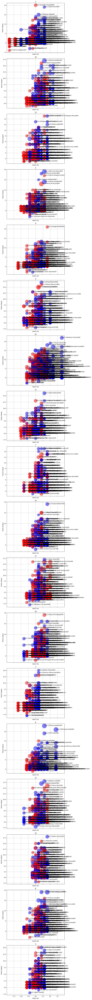

In [63]:
import matplotlib.pyplot as plt

positions = dummy_df['opponent_last_season_position'].unique()
fig, axs = plt.subplots(len(positions), 1, figsize=(10, 6 * len(positions)), sharex=True)
for i, pos in enumerate(positions):
    pos_data = dummy_df[dummy_df['opponent_last_season_position'] == pos]
    colors = np.where(pos_data['was_home'], 'blue', 'red')
    axs[i].scatter(pos_data['team_gd'], pos_data['total_points'], s= pos_data['value'] * 10, c=colors, alpha=0.5)
    axs[i].set_title(pos)
    axs[i].set_xlabel('Match GD')
    axs[i].set_ylabel('Points Output')
    for j, player in enumerate(pos_data['id']):
        axs[i].annotate(player, (pos_data['team_gd'].iloc[j], pos_data['total_points'].iloc[j]))
    axs[i].grid(True)
plt.tight_layout()
plt.show()


In [48]:
pos_data.dtypes

value                              int64
was_home                            bool
last_season_position               int64
team Goal scored                   int64
team Goal conceded                 int64
total_points                       int64
opponent_last_season_position      int64
id                                object
team_gd                            int64
Normalized                       float64
dtype: object

In [53]:
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
# import numpy as np

# positions = dummy_df['opponent_last_season_position'].unique()

# fig = make_subplots(rows=len(positions), cols=1, shared_xaxes=True, subplot_titles=str(positions))


# for i, pos in enumerate(positions):
#     pos_data = dummy_df[dummy_df['opponent_last_season_position'] == pos]
#     colors = np.where(pos_data['was_home'], 'blue', 'red')
#     fig.add_trace(go.Scatter(
#         x=pos_data['value'],
#         y=pos_data['total_points'],
#         mode='markers',
#         marker=dict(
#             size=pos_data['Normalized'],
#             color=colors,
#             opacity=0.5
#         ),
#         name=str(pos),
#         text=pos_data['id'],  
#         hoverinfo='text'  
#     ))

#     fig.update_xaxes(title_text='Player Cost', gridcolor='lightgray', row=i + 1, col=1)
#     fig.update_yaxes(title_text='Points Output', gridcolor='lightgray', row=i + 1, col=1)
#     fig.update_layout(title=f"Scatter Plot for Position {pos}", showlegend=True)


# fig.update_layout(height=300 * len(positions), width=1000, showlegend=True, title_text="Scatter Plots")

# fig.show()


In [ ]:
# NEW SEASON!!! NEW SEASON!!!

In [ ]:
# Current season data collection (Dynamic)

In [5]:
import requests
import pandas as pd

def get_player_fixture_info(id):
    player_info = requests.get(
        f"https://fantasy.premierleague.com/api/element-summary/{id}/"
    ).json()
    fixture = player_info["fixtures"][0]
    home_team = get_team_name(fixture["team_h"])
    away_team = get_team_name(fixture["team_a"])
    kickoff_time = fixture["kickoff_time"]
    is_home = fixture["is_home"]
    return home_team, away_team, kickoff_time, is_home


def get_gameweek_result(id, gameweek):
    "returns a dictionary of the statistics from the gameweek"
    gameweek_results = requests.get(
    f"https://fantasy.premierleague.com/api/element-summary/{id}/").json()
    return gameweek_results["history"][gameweek-1]

def get_team_name(id):
    general_information = requests.get(
        "https://fantasy.premierleague.com/api/bootstrap-static/"
    ).json()
    teams = general_information["teams"]
    for team in teams:
        if team["id"] == id:
            return team["name"]


def get_player_position(element_type):
    general_information = requests.get(
        "https://fantasy.premierleague.com/api/bootstrap-static/"
    ).json()
    positions = general_information["element_types"]
    for position in positions:
        if position["id"] == element_type:
            return position["singular_name_short"]

        
def get_fixture(matchday, name):
    # load week's fixture
    global gameweek_fixture
    gameweek_fixture_ = gameweek_fixture[gameweek_fixture["name"] == name]
    return (
        gameweek_fixture_["home_team"].iloc[0],
        gameweek_fixture_["away_team"].iloc[0],
        gameweek_fixture_["kickoff_time"].iloc[0],
        gameweek_fixture_["is_home"].iloc[0],
    )

# def get_old_fixture(matchday, name):
    
#     general_info = requests.get(
#     f"https://fantasy.premierleague.com/api/bootstrap-static/"
#     ).json()
#     player_infos = general_info["elements"]
#     for player_info in player_infos:
#         id = player_info["id"]
#         #     print(id)
#         name = player_info["first_name"] + " " + player_info["second_name"]
#         team_id = player_info["team"]
#         player_his_info = requests.get(
#             f"https://fantasy.premierleague.com/api/element-summary/{id}/"
#         ).json()
      

    
    

In [ ]:
# Getting previous gameweek fixtures


In [1]:
curr_gameweek= 34

In [2]:
import requests
import pandas as pd

In [ ]:
general_info = requests.get(
    f"https://fantasy.premierleague.com/api/bootstrap-static/"
).json()
player_infos = general_info["elements"]
idx = 24
for gameweek in range(10,1,-1):
    print(gameweek)
    my_teams = []
    home_teams = []
    away_teams = []
    kickoff_times = []
    is_homes = []
    positions = []
    costs = []
    names = []
    ids = []
    for player_info in player_infos:
        id = player_info["id"]
        #print(id)
        name = player_info["first_name"] + " " + player_info["second_name"]
        team_id = player_info["team"]
#         cost = player_info["now_cost"]
        element_type = player_info["element_type"]
        my_team = get_team_name(team_id)
        position = get_player_position(element_type)
        his_info = requests.get(
            f"https://fantasy.premierleague.com/api/element-summary/{id}/"
        ).json()
        try:
            fixture = his_info["history"][idx]
            cost = fixture["value"]
            is_home = fixture["was_home"]
            kickoff_time = fixture["kickoff_time"]
            if(is_home):
                home_team = my_team
                away_team = get_team_name(fixture["opponent_team"])
            else:
                home_team = get_team_name(fixture["opponent_team"])
                away_team = my_team
            ids.append(id)
            names.append(name)
            costs.append(cost)
            positions.append(position)
            my_teams.append(my_team)
            home_teams.append(home_team)
            away_teams.append(away_team)
            kickoff_times.append(kickoff_time)
            is_homes.append(is_home)
        except IndexError as e:
            print(id)
    df = pd.DataFrame()
    df["id"] = ids
    df["name"] = names
    df["cost"] = costs
    df["position"] = positions
    df["home_team"] = home_teams
    df["away_team"] = away_teams
    df["kickoff_time"] = kickoff_times
    df["is_home"] = is_homes
    df["team_x"] = my_teams
    df[df["team_x"]=="Wolves"]
    df.to_csv(f"GW{gameweek}_fixtures.csv")
    idx = idx + 1
    

10
735
736
737
764
772
815
817
765
767
778
793
803
818
799
802
804
811
849
733
744
752
789
797
834
741
742
746
747
753
755
786
816
843
845
805
806
758
791
819
820
830
838
847
851
852
763
792
807
821
825
842
760
761
841
796
810
743
756
757
782
783
812
813
824
837
734
798
831
839
844
848
762
771
814
748
766
768
826
833
835
846
850
738
739
745
794
795
779
780
781
801
808
809
759
775
790
822
823
827
828
740
754
776
777
773
774
784
785
829
749
750
751
769
770
787
788
800
832
836
840
9
735
736
737
764
772
815
817
765
767
778
793
803
818
799
802
804
811
849
733
744
752
789
797
834
741
742
746
747
753
755
786
816
843
845
805
806
758
791
819
820
830
838
847
851
852
763
792
807
821
825
842
760
761
841
732
796
810
743
756
757
782
783
812
813
824
837
734
798
831
839
844
848
762
771
814
748
766
768
826
833
835
846
850
738
739
745
794
795
779
780
781
801
808
809
759
775
790
822
823
827
828
740
754
776
777
773
774
784
785
829
749
750
751
769
770
787
788
800
832
836
840
8
735
736
737
764
772
815
817
7

In [8]:
df


NameError: name 'df' is not defined

In [12]:
df[df["team_x"]=="Wolves"]

,id,name,cost,position,home_team,away_team,kickoff_time,is_home,team_x
799,351,Tommy Doyle,44,MID,Burnley,Wolves,2023-08-11T19:00:00Z,False,Wolves
800,545,Rayan Aït-Nouri,47,DEF,Man Utd,Wolves,2023-08-14T19:00:00Z,False,Wolves
801,546,Daniel Bentley,39,GKP,Man Utd,Wolves,2023-08-14T19:00:00Z,False,Wolves
802,547,Bendegúz Bolla,40,DEF,Man Utd,Wolves,2023-08-14T19:00:00Z,False,Wolves
803,548,Hugo Bueno López,44,DEF,Man Utd,Wolves,2023-08-14T19:00:00Z,False,Wolves
804,549,Francisco Jorge Tomás Oliveira,45,MID,Man Utd,Wolves,2023-08-14T19:00:00Z,False,Wolves
805,550,Luke Cundle,45,MID,Man Utd,Wolves,2023-08-14T19:00:00Z,False,Wolves
806,551,Craig Dawson,45,DEF,Man Utd,Wolves,2023-08-14T19:00:00Z,False,Wolves
807,552,Fábio Silva,52,FWD,Man Utd,Wolves,2023-08-14T19:00:00Z,False,Wolves
808,554,Gonçalo Manuel Ganchinho Guedes,54,MID,Man Utd,Wolves,2023-08-14T19:00:00Z,False,Wolves


In [5]:
df

,id
0,815
1,817
2,32
3,34
4,35
...,...
422,751
423,787
424,788
425,832


In [2]:
general_info = requests.get(
    f"https://fantasy.premierleague.com/api/bootstrap-static/"
).json()
player_infos = general_info["elements"]
# gameweek = 32

# WEEKLY fixtures fixtures
my_teams = []
home_teams = []
away_teams = []
kickoff_times = []
is_homes = []
positions = []
costs = []
names = []
ids = []
general_info = requests.get(
    f"https://fantasy.premierleague.com/api/bootstrap-static/"
).json()
player_infos = general_info["elements"]

#print(player_infos[0])


# next gameweek
for player_info in player_infos:
    id = player_info["id"]
#     print(id)
    name = player_info["first_name"] + " " + player_info["second_name"]
    team_id = player_info["team"]
    cost = player_info["now_cost"]
    element_type = player_info["element_type"]
    my_team = get_team_name(team_id)
    position = get_player_position(element_type)
    home_team, away_team, kickoff_time, is_home = get_player_fixture_info(id)
    ids.append(id)
    names.append(name)
    costs.append(cost)
    positions.append(position)
    my_teams.append(my_team)
    home_teams.append(home_team)
    away_teams.append(away_team)
    kickoff_times.append(kickoff_time)
    is_homes.append(is_home)


df = pd.DataFrame()
df["id"] = ids
df["name"] = names
df["cost"] = costs
df["position"] = positions
df["home_team"] = home_teams
df["away_team"] = away_teams
df["kickoff_time"] = kickoff_times
df["is_home"] = is_homes
df["team_x"] = my_teams

1
2
3
4
5
6
8
9
10
11
12
13
14
15
16
17
18
19
20
22
24
25
26
29
30
31
113
540
578
585
646
735
736
737
764
772
815
817
32
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
53
54
55
56
57
58
59
60
61
584
599
618
670
672
686
699
765
767
778
793
803
818
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
595
607
619
643
644
673
705
799
802
804
811
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
114
115
116
117
118
119
120
121
258
508
620
684
701
725
733
744
752
789
797
834
122
123
124
125
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
146
147
148
149
150
151
152
153
154
155
606
621
690
700
741
742
746
747
753
755
786
816
843
845
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
200
475
594
596
600
605
608
622
660
674
675
694
706
805
806
126
145
185
186
187
188
189
190
191
192
194
195
196
197
198
199
201
202
203
206
207
208
210
211


In [4]:
df[df["team_x"]=="Wolves"]

,id,name,cost,position,home_team,away_team,kickoff_time,is_home,team_x
799,351,Tommy Doyle,44,MID,Wolves,West Ham,2024-04-06T14:00:00Z,True,Wolves
800,545,Rayan Aït-Nouri,47,DEF,Wolves,West Ham,2024-04-06T14:00:00Z,True,Wolves
801,546,Daniel Bentley,39,GKP,Wolves,West Ham,2024-04-06T14:00:00Z,True,Wolves
802,547,Bendegúz Bolla,40,DEF,Wolves,West Ham,2024-04-06T14:00:00Z,True,Wolves
803,548,Hugo Bueno López,44,DEF,Wolves,West Ham,2024-04-06T14:00:00Z,True,Wolves
804,549,Francisco Jorge Tomás Oliveira,45,MID,Wolves,West Ham,2024-04-06T14:00:00Z,True,Wolves
805,550,Luke Cundle,45,MID,Wolves,West Ham,2024-04-06T14:00:00Z,True,Wolves
806,551,Craig Dawson,45,DEF,Wolves,West Ham,2024-04-06T14:00:00Z,True,Wolves
807,552,Fábio Silva,52,FWD,Wolves,West Ham,2024-04-06T14:00:00Z,True,Wolves
808,554,Gonçalo Manuel Ganchinho Guedes,54,MID,Wolves,West Ham,2024-04-06T14:00:00Z,True,Wolves


In [ ]:
# Get Results 

In [17]:
new_gameweek = 32

In [24]:
# for gameweek in range(2,new_gameweek):
#     all_players = []
#     for player_info in player_infos:
#         try:
#             #print(all_players)
#             id = player_info["id"]
#             print(id)
#             name = player_info["first_name"] + " " + player_info["second_name"]
#             team_id = player_info["team"]
#             cost = player_info["now_cost"]
#             element_type = player_info["element_type"]
#             my_team = get_team_name(team_id)
#             position = get_player_position(element_type)
#             gameweek_result = get_gameweek_result(id, gameweek)
#             home_team, away_team, kickoff_time, is_home = get_fixture(gameweek, name)
#             #print(gameweek_result)
#             gameweek_result["id"] = id
#             gameweek_result["name"] = name
#             gameweek_result["cost"] = cost
#             gameweek_result["position"] = position
#             gameweek_result["home_team"] = home_team
#             gameweek_result["away_team"] = away_team
#             gameweek_result["team_x"] = my_team
#             gameweek_result["opponent_team"] = get_team_name(
#                 gameweek_result["opponent_team"]
#             )
#             all_players.append(gameweek_result)

#         except IndexError:
#             continue

#     # get x week result
#     # print(all_players)
#     df = pd.DataFrame(all_players)
#     df
#     df.to_csv(f"GW{gameweek}_results.csv")
    


SyntaxError: invalid syntax (823902019.py, line 1)

In [10]:
df.to_csv(f"GW{gameweek}_fixtures.csv")

In [ ]:
#Regression Plans

In [162]:
forward_statistics =['value', 'was_home', 'last_season_position', 'percent_value',
       'position rank', 'goals_scored_ex', 'assists_ex', 'total_points_ex',
       'minutes_ex', 'goals_conceded_ex', 'creativity_ex', 'influence_ex',
       'threat_ex', 'bonus_ex', 'bps_ex', 'ict_index_ex', 'now_cost_ex', 'GW', 'opponent_last_season_position',
        'mean assists 3','mean bonus 3', 'mean bps 3','mean creativity 3', 'mean goals_scored 3',
       'mean ict_index 3', 'mean influence 3', 'mean minutes 3', 'mean penalties_missed 3',  'mean threat 3',
       'mean total_points 3','mean value 3', 'mean match_result 3', 'std bps 3', 'std creativity 3',
       'std ict_index 3', 'std influence 3', 'std minutes 3',
       'std threat 3', 'std total_points 3', 'std value 3']

leak_columns = [
    "name",
    "team",
]  # columns that shouldnt be used in training fir fear of data leakage


dropped_columns = [
    "season",
    "opponent",
    "match_result",
   # "position",
    "assists",
    "penalties_missed",
    "bonus",
    "bps",
    "clean_sheets",
    "creativity",
    "goals_conceded",
    "goals_scored",
    "ict_index",
    "influence",
    "own_goals",
    "penalties_saved",
    "red_cards",
    "saves",
    "selected",
    "threat",
    "transfers_balance",
    "transfers_in",
    "transfers_out",
    "yellow_cards"]

midfielder_statistics =['value', 'was_home', 'last_season_position', 'percent_value',
       'position rank', 'goals_scored_ex', 'assists_ex', 'total_points_ex',
       'minutes_ex', 'goals_conceded_ex', 'creativity_ex', 'influence_ex',
       'threat_ex', 'bonus_ex', 'bps_ex', 'ict_index_ex', 'now_cost_ex', 'GW', 'opponent_last_season_position',
        'mean assists 3','mean bonus 3', 'mean bps 3','mean creativity 3', 'mean goals_scored 3',
       'mean ict_index 3', 'mean influence 3', 'mean minutes 3', 'mean penalties_missed 3',  'mean threat 3',
       'mean total_points 3','mean value 3', 'mean match_result 3', 'std bps 3', 'std creativity 3',
       'std ict_index 3', 'std influence 3', 'std minutes 3',
       'std threat 3', 'std total_points 3', 'std value 3']

goalkeeper_statistics = ['value', 'was_home', 'last_season_position', 'percent_value',
       'position rank', 'total_points_ex', 'minutes_ex', 'goals_conceded_ex',
       'bonus_ex', 'bps_ex', 'ict_index_ex', 'clean_sheets_ex',
       'red_cards_ex', 'now_cost_ex', 'GW', 'opponent_last_season_position',
       'mean bonus 3', 'mean bps 3', 'mean clean_sheets 3', 'mean goals_conceded 3',
       'mean ict_index 3',  'mean minutes 3',
       'mean own_goals 3',  'mean penalties_saved 3',
        'mean saves 3',  'mean threat 3',
       'mean total_points 3',
       'mean value 3', 'mean match_result 3', 'std bps 3',
       'std ict_index 3', 'std influence 3', 'std minutes 3',
       'std threat 3', 'std total_points 3', 'std value 3']

statistics =['value', 'position','was_home', 'last_season_position', 'percent_value',
       'position rank', 'goals_scored_ex', 'assists_ex', 'total_points_ex',
       'minutes_ex', 'goals_conceded_ex', 'creativity_ex', 'influence_ex',
       'threat_ex', 'bonus_ex', 'bps_ex', 'ict_index_ex', 'clean_sheets_ex',
       'yellow_cards_ex','now_cost_ex', 'GW', 'opponent_last_season_position', 'mean assists 3',
       'mean bonus 3', 'mean bps 3', 'mean clean_sheets 3',
       'mean creativity 3', 'mean goals_conceded 3', 'mean goals_scored 3',
       'mean ict_index 3', 'mean influence 3', 'mean minutes 3',
       'mean own_goals 3',
       'mean red_cards 3',  'mean threat 3','mean total_points 3',
       'mean value 3', 'mean match_result 3', 'std bps 3', 'std creativity 3',
       'std ict_index 3', 'std influence 3', 'std minutes 3',
       'std threat 3', 'std total_points 3', 'std value 3','mean saves 3','mean assists all',
       'mean bonus all', 'mean bps all', 'mean clean_sheets all',
       'mean creativity all', 'mean goals_conceded all', 'mean goals_scored all',
       'mean ict_index all', 'mean influence all', 'mean minutes all',
       'mean own_goals all',
       'mean red_cards all',  'mean threat all','mean total_points all',
       'mean value all', 'mean match_result all',
       'mean team Goal scored 3','mean team Goal scored all','mean team Goal conceded 3','mean team Goal conceded all',"ratio_goal_scored all","ratio_goal_scored 3",
       'opp mean team Goal scored 3','opp mean team Goal conceded 3','opp mean team Goal scored all','opp mean team Goal conceded all',"opp mean match_result all"]


date_cols=["day_of week","month","hour","week"]

In [163]:
from hyperopt import tpe,hp,fmin,STATUS_OK,Trials
from hyperopt.pyll.base import scope

In [164]:
def convert_minutes(val):
    """CONVERTS MINUTES TO A CATEGORICAL OUTPUT"""
    if val > 10:
        return 1
    else:
        return 0

In [14]:
gameweek = 1

In [15]:
train = pd.read_csv("/kaggle/input/predict/cleaned_previous_seasons.csv",index_col=0)
test = pd.read_csv(f"/kaggle/input/predict/GW{gameweek}.csv", index_col=0)

In [20]:
len(test.columns)



87

In [141]:
train

,name,position,team,assists,bonus,bps,clean_sheets,creativity,goals_conceded,goals_scored,...,std creativity 3,std ict_index 3,std influence 3,std minutes 3,std selected 3,std threat 3,std total_points 3,std transfers_in 3,std transfers_out 3,std value 3
377,Shkodran Mustafi,DEF,Arsenal,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
480,Shkodran Mustafi,DEF,Arsenal,0,0,0,0,0.0,0,0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0
495,Shkodran Mustafi,DEF,Arsenal,0,0,0,0,0.0,0,0,...,0.0,0.0,0.0,0.0,58.500000,0.0,0.0,20.500000,97.000000,0.0
501,Shkodran Mustafi,DEF,Arsenal,0,0,0,0,0.0,0,0,...,0.0,0.0,0.0,0.0,58.732917,0.0,0.0,4553.091331,4565.768354,0.0
518,Shkodran Mustafi,DEF,Arsenal,0,0,0,0,0.0,0,0,...,0.0,0.0,0.0,0.0,6.599663,0.0,0.0,4541.041584,4534.515361,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,Shea Charles,MID,Man City,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
249,Shea Charles,MID,Man City,0,0,0,0,0.0,0,0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0
210,Shea Charles,MID,Man City,0,0,3,0,0.0,1,0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0
530,Samuel Amo-Ameyaw,MID,Southampton,0,0,6,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
len(train.columns)

85

In [ ]:
missing_stats = [value for value in statistics if value in list(train.columns)]

In [21]:
stats = [value for value in list(test.columns) if value not in list(train.columns)]
stats

['cost', 'element_type_ex']

In [140]:
test

,total_points,was_home,kickoff_time,minutes,goals_scored,assists,clean_sheets,goals_conceded,own_goals,penalties_saved,...,std creativity 3,std ict_index 3,std influence 3,std minutes 3,std selected 3,std threat 3,std total_points 3,std transfers_in 3,std transfers_out 3,std value 3
129,0.0,True,2023-08-12T14:00:00Z,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
569,0.0,False,2023-08-12T14:00:00Z,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
108,0.0,True,2023-08-13T13:00:00Z,71.0,0.0,0.0,0.0,2.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16,2.0,True,2023-08-12T12:00:00Z,90.0,0.0,0.0,0.0,1.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
427,12.0,True,2023-08-14T19:00:00Z,90.0,0.0,1.0,1.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
530,2.0,False,2023-08-13T13:00:00Z,90.0,0.0,0.0,0.0,2.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
393,0.0,False,2023-08-11T19:00:00Z,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
188,2.0,True,2023-08-11T19:00:00Z,60.0,0.0,0.0,0.0,2.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
406,0.0,True,2023-08-14T19:00:00Z,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [167]:
test.columns

Index(['total_points', 'was_home', 'kickoff_time', 'minutes', 'goals_scored',
       'assists', 'clean_sheets', 'goals_conceded', 'own_goals',
       'penalties_saved', 'penalties_missed', 'yellow_cards', 'red_cards',
       'saves', 'bonus', 'bps', 'influence', 'creativity', 'threat',
       'ict_index', 'value', 'transfers_balance', 'selected', 'transfers_in',
       'transfers_out', 'name', 'cost', 'position', 'team', 'GW',
       'match_result', 'opponent', 'last_season_position',
       'opponent_last_season_position', 'percent_value', 'position rank',
       'goals_scored_ex', 'assists_ex', 'total_points_ex', 'minutes_ex',
       'goals_conceded_ex', 'creativity_ex', 'influence_ex', 'threat_ex',
       'bonus_ex', 'bps_ex', 'ict_index_ex', 'clean_sheets_ex', 'red_cards_ex',
       'yellow_cards_ex', 'selected_by_percent_ex', 'now_cost_ex',
       'element_type_ex', 'season', 'mean assists 3', 'mean bonus 3',
       'mean bps 3', 'mean clean_sheets 3', 'mean creativity 3',
       

In [175]:
train["position"]=train["position"].replace({"GKP":"GK" })
train["position"].value_counts()

position
MID    31795
DEF    26581
FWD     9624
GK      8469
Name: count, dtype: int64

In [177]:
test = test[train.columns]

In [178]:

train_copy = train.copy()
test_copy = test.copy()

# train["index"] = train["name"] + train["kickoff_time"].astype("str")
# train.drop_duplicates("index", keep="last", inplace=True)
# train= train.set_index("index")
# train["date"]=pd.to_datetime(train["kickoff_time"])
# train["day_of week"]=train["date"].dt.day_name
# train["month"]=train["date"].dt.month
# train["hour"]=train["date"].dt.hour
# train["week"]=train["date"].dt.weekday
# train.drop(["kickoff_time","date"], axis=1, inplace=True)

# test["index"] = test["name"] + test["kickoff_time"].astype("str")
# test= test.set_index("index")
# test["date"]=pd.to_datetime(test["kickoff_time"])
# test["day_of week"]=test["date"].dt.day_name
# test["month"]=test["date"].dt.month
# test["hour"]=test["date"].dt.hour
# test["week"]=test["date"].dt.weekday
# test.drop(["kickoff_time","date"], axis=1, inplace=True)
# train["minutes"] = train["minutes"].apply(convert_minutes)

# target = train[["minutes", "GW","position" ]]
# train.drop(["total_points", "minutes"], axis=1, inplace=True)
# test.drop(["total_points", "minutes"], axis=1, inplace=True)
# train.drop(dropped_columns, axis=1, inplace=True)
# test.drop(dropped_columns, axis=1, inplace=True)


# # Convert categorical columns to numerical
# for col in train.columns:
#     if train[col].dtype == "object":
#         if col not in ["team", "name","position"]:
#             train[col] = pd.factorize(train[col])[0]
#             test[col] = pd.factorize(test[col])[0]

# train["was_home"] = train["was_home"].replace({True: 0, False: 1})
# test["was_home"] = test["was_home"].replace({True: 0, False: 1})

# train = train[statistics + leak_columns+date_cols]
# test = test[statistics + leak_columns+date_cols]

# x, val, y, y_val = train_test_split(
#     train.drop(leak_columns, axis=1),
#     target["minutes"],
#     test_size=0.1,
#     random_state=0,
# )

In [179]:
train["index"] = train["name"] + train["kickoff_time"].astype("str")
train.drop_duplicates("index", keep="last", inplace=True)
train= train.set_index("index")
train["date"]=pd.to_datetime(train["kickoff_time"])
train["day_of week"]=train["date"].dt.day_name
train["month"]=train["date"].dt.month
train["hour"]=train["date"].dt.hour
train["week"]=train["date"].dt.weekday
train.drop(["kickoff_time","date"], axis=1, inplace=True)

test["index"] = test["name"] + test["kickoff_time"].astype("str")
test = test.set_index("index")
test["date"]=pd.to_datetime(test["kickoff_time"])
test["day_of week"]=test["date"].dt.day_name
test["month"]=test["date"].dt.month
test["hour"]=test["date"].dt.hour
test["week"]=test["date"].dt.weekday
test.drop(["kickoff_time","date"], axis=1, inplace=True)

target = train[["total_points", "GW","position" ]]
train.drop(["total_points", "minutes"], axis=1, inplace=True)
test.drop(["total_points", "minutes"], axis=1, inplace=True)
train.drop(dropped_columns, axis=1, inplace=True)
test.drop(dropped_columns, axis=1, inplace=True)


for col in train.columns:
    if train[col].dtype == "object":
        if col not in ["team", "name","position"]:
            train[col] = pd.factorize(train[col])[0]
            test[col] = pd.factorize(test[col])[0]

train["position"]=train["position"].astype("category")
test["position"]=test["position"].astype("category")
train["was_home"] = train["was_home"].replace({True: 0, False: 1})
test["was_home"] = test["was_home"].replace({True: 0, False: 1})

train = train[stats + leak_columns+date_cols]
test= test[stats + leak_columns+date_cols]



/tmp/ipykernel_33/1860514894.py:35: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`

/tmp/ipykernel_33/1860514894.py:36: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



NameError: name 'train_test_split' is not defined

In [193]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.ensemble import (
    RandomForestClassifier,
    RandomForestRegressor,
    GradientBoostingRegressor,
)
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    confusion_matrix,
    accuracy_score,
    f1_score,
)
from lightgbm import LGBMRegressor, LGBMClassifier
from catboost import CatBoostClassifier, CatBoostRegressor
from sklearn.model_selection import StratifiedKFold,KFold

In [181]:
x, val, y, y_val = train_test_split(
    train.drop(leak_columns, axis=1),
    target["total_points"],
    test_size=0.1,
    random_state=0,
)

In [182]:
from sklearn.model_selection import KFold


folds=KFold(n_splits=8,shuffle=True,random_state=0)


predictions_df=pd.DataFrame()

#list to save the mean absolute errors from validatingon each folds
rmse_val=[]
rmse_X=[]


model=LGBMRegressor(**{'colsample_bytree': 0.4199299182268318, 'learning_rate': 0.0032874466037521254, 'max_depth': 9, 'min_split_gain': 0.5685369160138952, 'num_leaves': 99, 'reg_alpha': 0.5621526419488447, 'reg_lambda': 0, 'subsample': 0.6534153111773866}, verbose=-50,random_state=0,early_stopping_rounds=200,n_estimators=10000)

#train model, make predictions and check the validation accuracy on  each fold
for i,(train_index,test_index) in enumerate(folds.split(train.drop(leak_columns, axis=1),target["total_points"])):
    train_fold=train.drop(leak_columns, axis=1).iloc[train_index]
    val_fold=train.drop(leak_columns, axis=1).iloc[test_index]
    y_fold=target["total_points"].iloc[train_index]
    y_val_fold=target["total_points"].iloc[test_index]


    model.fit(train_fold,y_fold,eval_set=[(val_fold,y_val_fold)])
    print(i+1)
    prediction=model.predict(test.drop(leak_columns, axis=1))
    predictions_df[i]=prediction
    rmse_val.append(mean_squared_error(model.predict(val_fold),y_val_fold,squared=False))
    rmse_X.append(mean_squared_error(model.predict(train_fold),y_fold,squared=False))
print(rmse_val)
print(rmse_X)

1
2
3
4
5
6
7
8
[2.052616913885072, 2.0016556334366253, 2.066816131406712, 2.0000855526763415, 2.0595955584557304, 2.041648646777974, 1.995619341788085, 2.0442852988741986]
[1.7557239221098666, 1.798848746752882, 1.694325413342262, 1.8052218489372907, 1.668365224381373, 1.721015739246082, 1.6881309613008646, 1.740048919002671]


In [183]:
print(np.mean(rmse_val))
print(np.mean(rmse_X))

2.0327903846625928
1.7339600968841615


In [187]:
test.columns

Index(['value', 'position', 'was_home', 'last_season_position',
       'percent_value', 'position rank', 'goals_scored_ex', 'assists_ex',
       'total_points_ex', 'minutes_ex', 'goals_conceded_ex', 'creativity_ex',
       'influence_ex', 'threat_ex', 'bonus_ex', 'bps_ex', 'ict_index_ex',
       'clean_sheets_ex', 'yellow_cards_ex', 'now_cost_ex', 'GW',
       'opponent_last_season_position', 'mean assists 3', 'mean bonus 3',
       'mean bps 3', 'mean clean_sheets 3', 'mean creativity 3',
       'mean goals_conceded 3', 'mean goals_scored 3', 'mean ict_index 3',
       'mean influence 3', 'mean minutes 3', 'mean own_goals 3',
       'mean red_cards 3', 'mean threat 3', 'mean total_points 3',
       'mean value 3', 'mean match_result 3', 'std bps 3', 'std creativity 3',
       'std ict_index 3', 'std influence 3', 'std minutes 3', 'std threat 3',
       'std total_points 3', 'std value 3', 'mean saves 3', 'name', 'team',
       'day_of week', 'month', 'hour', 'week', 'points'],
      d

In [188]:
test[test["position"]=="MID"].sort_values(by="points",ascending=False).head(11)[["name","opponent_last_season_position","was_home","points","team","value"]]

,name,opponent_last_season_position,was_home,points,team,value
index,,,,,,
Mohamed Salah2023-08-13T15:30:00Z,Mohamed Salah,12,1,10.182815,Liverpool,125
Martin Ødegaard2023-08-12T12:00:00Z,Martin Ødegaard,16,0,6.500668,Arsenal,85
Bukayo Saka2023-08-12T12:00:00Z,Bukayo Saka,16,0,6.240895,Arsenal,85
Bruno Borges Fernandes2023-08-14T19:00:00Z,Bruno Borges Fernandes,13,0,5.791867,Man Utd,85
Kevin De Bruyne2023-08-11T19:00:00Z,Kevin De Bruyne,20,1,5.638430,Man City,105
Gabriel Martinelli Silva2023-08-12T12:00:00Z,Gabriel Martinelli Silva,16,0,5.130547,Arsenal,80
Marcus Rashford2023-08-14T19:00:00Z,Marcus Rashford,13,0,4.194368,Man Utd,90
Pascal Groß2023-08-12T14:00:00Z,Pascal Groß,20,0,4.002104,Brighton,65
Solly March2023-08-12T14:00:00Z,Solly March,20,0,3.555792,Brighton,65


In [189]:
test[test["position"]=="DEF"].sort_values(by="points",ascending=False).head(10)[["name","opponent_last_season_position","was_home","points","team","value"]]
     

,name,opponent_last_season_position,was_home,points,team,value
index,,,,,,
Kieran Trippier2023-08-12T16:30:00Z,Kieran Trippier,7,0,4.389531,Newcastle,65
Trent Alexander-Arnold2023-08-13T15:30:00Z,Trent Alexander-Arnold,12,1,4.257807,Liverpool,80
Andrew Robertson2023-08-13T15:30:00Z,Andrew Robertson,12,1,2.742380,Liverpool,65
Ben Mee2023-08-13T13:00:00Z,Ben Mee,8,0,2.606454,Brentford,50
Pervis Estupiñán2023-08-12T14:00:00Z,Pervis Estupiñán,20,0,2.451813,Brighton,50
Virgil van Dijk2023-08-13T15:30:00Z,Virgil van Dijk,12,1,2.421160,Liverpool,60
Lewis Dunk2023-08-12T14:00:00Z,Lewis Dunk,20,0,2.408961,Brighton,50
Lisandro Martínez2023-08-14T19:00:00Z,Lisandro Martínez,13,0,2.341776,Man Utd,50
William Saliba2023-08-12T12:00:00Z,William Saliba,16,0,2.321176,Arsenal,50


In [191]:
test[test["position"]=="GKP"].sort_values(by="points",ascending=False).head(10)[["name","opponent_last_season_position","was_home","points","team","value"]]
     

,name,opponent_last_season_position,was_home,points,team,value
index,,,,,,
Aaron Ramsdale2023-08-12T12:00:00Z,Aaron Ramsdale,16,0,3.653835,Arsenal,50
Alisson Ramses Becker2023-08-13T15:30:00Z,Alisson Ramses Becker,12,1,3.400355,Liverpool,55
David Raya Martin2023-08-13T13:00:00Z,David Raya Martin,9,0,3.256289,Arsenal,50
José Malheiro de Sá2023-08-14T19:00:00Z,José Malheiro de Sá,3,1,3.143887,Wolves,50
Emiliano Martínez Romero2023-08-12T16:30:00Z,Emiliano Martínez Romero,4,1,2.944158,Aston Villa,50
Nick Pope2023-08-12T16:30:00Z,Nick Pope,7,0,2.715660,Newcastle,55
Lukasz Fabianski2023-08-12T14:00:00Z,Lukasz Fabianski,15,1,2.629725,West Ham,45
Ederson Santana de Moraes2023-08-11T19:00:00Z,Ederson Santana de Moraes,20,1,2.539753,Man City,55
Bernd Leno2023-08-12T14:00:00Z,Bernd Leno,17,1,2.145955,Fulham,45


In [192]:
test[test["position"]=="FWD"].sort_values(by="points",ascending=False).head(10)[["name","opponent_last_season_position","was_home","points","team","value"]]
     

,name,opponent_last_season_position,was_home,points,team,value
index,,,,,,
Erling Haaland2023-08-11T19:00:00Z,Erling Haaland,20,1,10.194150,Man City,140
Harry Kane2023-08-13T13:00:00Z,Harry Kane,9,1,9.730697,Spurs,125
Ivan Toney2023-08-13T13:00:00Z,Ivan Toney,8,0,4.462744,Brentford,80
Aleksandar Mitrović2023-08-12T14:00:00Z,Aleksandar Mitrović,17,1,3.465743,Fulham,75
Gabriel Fernando de Jesus2023-08-12T12:00:00Z,Gabriel Fernando de Jesus,16,0,3.355168,Arsenal,80
Dominic Solanke2023-08-12T14:00:00Z,Dominic Solanke,14,0,3.088639,Bournemouth,65
Ollie Watkins2023-08-12T16:30:00Z,Ollie Watkins,4,1,2.984169,Aston Villa,80
Callum Wilson2023-08-12T16:30:00Z,Callum Wilson,7,0,2.849204,Newcastle,80
Darwin Núñez Ribeiro2023-08-13T15:30:00Z,Darwin Núñez Ribeiro,12,1,2.730184,Liverpool,75


In [184]:
test["points"]=np.mean(predictions_df, axis=1).values

test[leak_columns + ["points", "value"]].sort_values("points", ascending=False).to_csv("points.csv")

In [4]:
import pandas as pd
SARIMAX_df = pd.read_csv("C:/Users/sraja/Desktop/WORK/CAPSTONE/DATA/final_prev_seasons.csv").drop(columns="Unnamed: 0")
SARIMAX_df 

,name,position,team,assists,bonus,bps,clean_sheets,creativity,goals_conceded,goals_scored,...,std transfers_in 3,std transfers_out 3,std value 3,ratio_goal_scored 3,ratio_goal_scored all,opp mean team Goal scored 3,opp mean team Goal conceded 3,opp mean team Goal scored all,opp mean team Goal conceded all,opp mean match_result all
0,Tim Ream,DEF,Fulham,0,0,16,0,0.8,3,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,David Luiz Moreira Marinho,DEF,Arsenal,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Matteo Guendouzi,MID,Arsenal,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Tom Cairney,MID,Fulham,0,0,11,0,10.2,3,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Matt Macey,GK,Arsenal,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86847,Shea Charles,MID,Man City,0,0,3,0,0.0,1,0,...,0.0,0.0,0.0,0.0,0.0,1.666667,0.666667,1.540541,1.243243,1.513514
86848,Alex Robertson,MID,Man City,0,0,0,0,0.0,0,0,...,0.0,0.0,0.0,0.0,0.0,1.666667,0.666667,1.540541,1.243243,1.513514
86849,Nico O'Reilly,MID,Man City,0,0,0,0,0.0,0,0,...,0.0,0.0,0.0,0.0,0.0,1.666667,0.666667,1.540541,1.243243,1.513514
86850,Yago de Santiago Alonso,MID,Spurs,0,0,0,0,0.0,0,0,...,NaN,NaN,NaN,NaN,NaN,1.333333,2.333333,1.270270,2.000000,0.837838


In [5]:
test_SARIMAX = pd.read_csv("C:/Users/sraja/Desktop/WORK/CAPSTONE/GWs/GW34_fixtures.csv").drop(columns="Unnamed: 0")
test_SARIMAX

,id,name,cost,position,home_team,away_team,kickoff_time,is_home,team_x
0,1,Folarin Balogun,45,FWD,Arsenal,Nott'm Forest,2023-08-12T12:00:00Z,True,Arsenal
1,2,Cédric Alves Soares,40,DEF,Arsenal,Nott'm Forest,2023-08-12T12:00:00Z,True,Arsenal
2,3,Mohamed Elneny,45,MID,Arsenal,Nott'm Forest,2023-08-12T12:00:00Z,True,Arsenal
3,4,Fábio Ferreira Vieira,55,MID,Arsenal,Nott'm Forest,2023-08-12T12:00:00Z,True,Arsenal
4,5,Gabriel dos Santos Magalhães,50,DEF,Arsenal,Nott'm Forest,2023-08-12T12:00:00Z,True,Arsenal
...,...,...,...,...,...,...,...,...,...
846,788,Yerson Mosquera,40,DEF,Brighton,Wolves,2024-01-22T19:45:00Z,False,Wolves
847,800,Noha Lemina,50,MID,Wolves,Man Utd,2024-02-01T20:15:00Z,True,Wolves
848,832,Wesley Okoduwa,40,DEF,Newcastle,Wolves,2024-03-02T15:00:00Z,False,Wolves
849,836,Leon Chiwome,45,FWD,Wolves,Fulham,2024-03-09T15:00:00Z,True,Wolves


In [7]:
SARIMAX_df.columns.tolist()

['name',
 'position',
 'team',
 'assists',
 'bonus',
 'bps',
 'clean_sheets',
 'creativity',
 'goals_conceded',
 'goals_scored',
 'ict_index',
 'influence',
 'kickoff_time',
 'minutes',
 'own_goals',
 'penalties_missed',
 'penalties_saved',
 'red_cards',
 'saves',
 'selected',
 'threat',
 'total_points',
 'transfers_balance',
 'transfers_in',
 'transfers_out',
 'value',
 'was_home',
 'yellow_cards',
 'last_season_position',
 'percent_value',
 'position rank',
 'match_result',
 'goals_scored_ex',
 'assists_ex',
 'total_points_ex',
 'minutes_ex',
 'goals_conceded_ex',
 'creativity_ex',
 'influence_ex',
 'threat_ex',
 'bonus_ex',
 'bps_ex',
 'ict_index_ex',
 'clean_sheets_ex',
 'red_cards_ex',
 'yellow_cards_ex',
 'selected_by_percent_ex',
 'now_cost_ex',
 'season',
 'GW',
 'opponent',
 'opponent_last_season_position',
 'team Goal scored',
 'team Goal conceded',
 'mean assists 3',
 'mean assists all',
 'mean bonus 3',
 'mean bonus all',
 'mean bps 3',
 'mean bps all',
 'mean clean_sheets 

In [11]:
train_SARIMAX = SARIMAX_df[SARIMAX_df["season"]!="2022-23"]
test_SARIMAX = SARIMAX_df[SARIMAX_df["season"]=="2022-23"][SARIMAX_df["GW"]==4]


C:\Users\sraja\AppData\Local\Temp\ipykernel_11060\3051656614.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  test_SARIMAX = SARIMAX_df[SARIMAX_df["season"]=="2022-23"][SARIMAX_df["GW"]==4]


In [15]:
train_SARIMAX = train_SARIMAX.drop(columns=['assists',
 'bonus',
 'bps',
 'clean_sheets',
 'creativity',
 'ict_index',
 'influence',
 'own_goals',
 'penalties_missed',
 'penalties_saved',
 'red_cards',
 'saves',
 'selected',
 'threat',
 'total_points',
 'transfers_balance',
 'transfers_in',
 'transfers_out',
 'yellow_cards',
 'percent_value',
 'position rank',
 'match_result',
 'assists_ex',
 'total_points_ex',
 'creativity_ex',
 'influence_ex',
 'threat_ex',
 'bonus_ex',
 'bps_ex',
 'ict_index_ex',
 'clean_sheets_ex',
 'red_cards_ex',
 'yellow_cards_ex',
 'selected_by_percent_ex',
 'now_cost_ex',
 'mean assists 3',
 'mean assists all',
 'mean bonus 3',
 'mean bonus all',
 'mean bps 3',
 'mean bps all',
 'mean clean_sheets 3',
 'mean clean_sheets all',
 'mean creativity 3',
 'mean creativity all',
 'mean goals_conceded 3',
 'mean goals_conceded all',
 'mean goals_scored 3',
 'mean goals_scored all',
 'mean ict_index 3',
 'mean ict_index all',
 'mean influence 3',
 'mean influence all',
 'mean minutes 3',
 'mean minutes all',
 'mean own_goals 3',
 'mean own_goals all',
 'mean penalties_missed 3',
 'mean penalties_missed all',
 'mean penalties_saved 3',
 'mean penalties_saved all',
 'mean red_cards 3',
 'mean red_cards all',
 'mean saves 3',
 'mean saves all',
 'mean selected 3',
 'mean selected all',
 'mean threat 3',
 'mean threat all',
 'mean total_points 3',
 'mean total_points all',
 'mean transfers_in 3',
 'mean transfers_in all',
 'mean transfers_out 3',
 'mean transfers_out all',
 'mean value 3',
 'mean value all',
 'mean match_result 3',
 'mean match_result all',
 'std bps 3',
 'std creativity 3',
 'std ict_index 3',
 'std influence 3',
 'std minutes 3',
 'std selected 3',
 'std threat 3',
 'std total_points 3',
 'std transfers_in 3',
 'std transfers_out 3',
 'std value 3',
 'opp mean match_result all'
 ])


KeyError: "['assists', 'bonus', 'bps', 'clean_sheets', 'creativity', 'ict_index', 'influence', 'own_goals', 'penalties_missed', 'penalties_saved', 'red_cards', 'saves', 'selected', 'threat', 'total_points', 'transfers_balance', 'transfers_in', 'transfers_out', 'yellow_cards', 'percent_value', 'position rank', 'match_result', 'assists_ex', 'total_points_ex', 'creativity_ex', 'influence_ex', 'threat_ex', 'bonus_ex', 'bps_ex', 'ict_index_ex', 'clean_sheets_ex', 'red_cards_ex', 'yellow_cards_ex', 'selected_by_percent_ex', 'now_cost_ex', 'mean assists 3', 'mean assists all', 'mean bonus 3', 'mean bonus all', 'mean bps 3', 'mean bps all', 'mean clean_sheets 3', 'mean clean_sheets all', 'mean creativity 3', 'mean creativity all', 'mean goals_conceded 3', 'mean goals_conceded all', 'mean goals_scored 3', 'mean goals_scored all', 'mean ict_index 3', 'mean ict_index all', 'mean influence 3', 'mean influence all', 'mean minutes 3', 'mean minutes all', 'mean own_goals 3', 'mean own_goals all', 'mean penalties_missed 3', 'mean penalties_missed all', 'mean penalties_saved 3', 'mean penalties_saved all', 'mean red_cards 3', 'mean red_cards all', 'mean saves 3', 'mean saves all', 'mean selected 3', 'mean selected all', 'mean threat 3', 'mean threat all', 'mean total_points 3', 'mean total_points all', 'mean transfers_in 3', 'mean transfers_in all', 'mean transfers_out 3', 'mean transfers_out all', 'mean value 3', 'mean value all', 'mean match_result 3', 'mean match_result all', 'std bps 3', 'std creativity 3', 'std ict_index 3', 'std influence 3', 'std minutes 3', 'std selected 3', 'std threat 3', 'std total_points 3', 'std transfers_in 3', 'std transfers_out 3', 'std value 3', 'opp mean match_result all'] not found in axis"

In [16]:
train_SARIMAX

,name,position,team,goals_conceded,goals_scored,kickoff_time,minutes,value,was_home,last_season_position,...,mean team Goal scored 3,mean team Goal scored all,mean team Goal conceded 3,mean team Goal conceded all,ratio_goal_scored 3,ratio_goal_scored all,opp mean team Goal scored 3,opp mean team Goal conceded 3,opp mean team Goal scored all,opp mean team Goal conceded all
0,Tim Ream,DEF,Fulham,3,0,2020-09-12 11:30:00+00:00,90,45,True,20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,David Luiz Moreira Marinho,DEF,Arsenal,0,0,2020-09-12 11:30:00+00:00,0,55,False,8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Matteo Guendouzi,MID,Arsenal,0,0,2020-09-12 11:30:00+00:00,0,50,False,8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Tom Cairney,MID,Fulham,3,0,2020-09-12 11:30:00+00:00,90,55,True,20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Matt Macey,GK,Arsenal,0,0,2020-09-12 11:30:00+00:00,0,40,False,8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57229,Tyler Dibling,MID,Southampton,0,0,2022-05-22 15:00:00+00:00,0,45,False,15,...,0.500000,0.500000,2.5,2.5,0.0,0.0,3.000000,0.666667,1.567568,1.567568
57230,Jack Grieves,FWD,Watford,0,0,2022-05-22 15:00:00+00:00,0,45,False,20,...,0.333333,0.333333,2.0,2.0,0.0,0.0,2.000000,1.000000,1.969697,0.939394
57231,Adrian Blake,MID,Watford,0,0,2022-05-22 15:00:00+00:00,0,45,False,20,...,0.333333,0.333333,2.0,2.0,0.0,0.0,2.000000,1.000000,1.969697,0.939394
57232,Joseph McGlynn,FWD,Burnley,0,0,2022-05-22 15:00:00+00:00,0,45,True,17,...,0.500000,0.500000,1.0,1.0,0.0,0.0,0.666667,2.000000,1.135135,1.648649


In [21]:
train_SARIMAX.values[0]

array(['Tim Ream', 'DEF', 'Fulham', 3, 0, '2020-09-12 11:30:00+00:00', 90,
       45, True, 20, nan, nan, nan, '2020-21', 1, 'Arsenal', 8, 0, 3, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan], dtype=object)

In [18]:
test_SARIMAX = test_SARIMAX.drop(columns=['assists',
 'bonus',
 'bps',
 'clean_sheets',
 'creativity',
 'ict_index',
 'influence',
 'own_goals',
 'penalties_missed',
 'penalties_saved',
 'red_cards',
 'saves',
 'selected',
 'threat',
 'total_points',
 'transfers_balance',
 'transfers_in',
 'transfers_out',
 'yellow_cards',
 'percent_value',
 'position rank',
 'match_result',
 'assists_ex',
 'total_points_ex',
 'creativity_ex',
 'influence_ex',
 'threat_ex',
 'bonus_ex',
 'bps_ex',
 'ict_index_ex',
 'clean_sheets_ex',
 'red_cards_ex',
 'yellow_cards_ex',
 'selected_by_percent_ex',
 'now_cost_ex',
 'mean assists 3',
 'mean assists all',
 'mean bonus 3',
 'mean bonus all',
 'mean bps 3',
 'mean bps all',
 'mean clean_sheets 3',
 'mean clean_sheets all',
 'mean creativity 3',
 'mean creativity all',
 'mean goals_conceded 3',
 'mean goals_conceded all',
 'mean goals_scored 3',
 'mean goals_scored all',
 'mean ict_index 3',
 'mean ict_index all',
 'mean influence 3',
 'mean influence all',
 'mean minutes 3',
 'mean minutes all',
 'mean own_goals 3',
 'mean own_goals all',
 'mean penalties_missed 3',
 'mean penalties_missed all',
 'mean penalties_saved 3',
 'mean penalties_saved all',
 'mean red_cards 3',
 'mean red_cards all',
 'mean saves 3',
 'mean saves all',
 'mean selected 3',
 'mean selected all',
 'mean threat 3',
 'mean threat all',
 'mean total_points 3',
 'mean total_points all',
 'mean transfers_in 3',
 'mean transfers_in all',
 'mean transfers_out 3',
 'mean transfers_out all',
 'mean value 3',
 'mean value all',
 'mean match_result 3',
 'mean match_result all',
 'std bps 3',
 'std creativity 3',
 'std ict_index 3',
 'std influence 3',
 'std minutes 3',
 'std selected 3',
 'std threat 3',
 'std total_points 3',
 'std transfers_in 3',
 'std transfers_out 3',
 'std value 3',
 'opp mean match_result all'
 ])


In [19]:
test_SARIMAX

,name,position,team,goals_conceded,goals_scored,kickoff_time,minutes,value,was_home,last_season_position,...,mean team Goal scored 3,mean team Goal scored all,mean team Goal conceded 3,mean team Goal conceded all,ratio_goal_scored 3,ratio_goal_scored all,opp mean team Goal scored 3,opp mean team Goal conceded 3,opp mean team Goal scored all,opp mean team Goal conceded all
58980,Tim Ream,DEF,Fulham,2,0,2022-08-27 16:30:00+00:00,87,45,False,20,...,1.666667,1.666667,1.333333,1.333333,0.000000,0.000000,3.000000,0.666667,3.000000,0.666667
58981,Tom Cairney,MID,Fulham,1,0,2022-08-27 16:30:00+00:00,21,49,False,20,...,1.666667,1.666667,1.333333,1.333333,0.000000,0.000000,3.000000,0.666667,3.000000,0.666667
58982,Marek RodÃ¡k,GK,Fulham,0,0,2022-08-27 16:30:00+00:00,0,45,False,20,...,1.666667,1.666667,1.333333,1.333333,0.000000,0.000000,3.000000,0.666667,3.000000,0.666667
58983,William Saliba,DEF,Arsenal,1,0,2022-08-27 16:30:00+00:00,90,46,True,5,...,3.000000,3.000000,0.666667,0.666667,11.111111,11.111111,1.666667,1.333333,1.666667,1.333333
58984,Joe Bryan,DEF,Fulham,0,0,2022-08-27 16:30:00+00:00,0,44,False,20,...,1.666667,1.666667,1.333333,1.333333,0.000000,0.000000,3.000000,0.666667,3.000000,0.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59576,Owen Bevan,DEF,Bournemouth,1,0,2022-08-27 14:00:00+00:00,8,40,False,20,...,NaN,NaN,NaN,NaN,NaN,NaN,1.333333,1.666667,1.333333,1.666667
59577,Ben Knight,MID,Man City,0,0,2022-08-27 14:00:00+00:00,0,45,True,1,...,NaN,NaN,NaN,NaN,NaN,NaN,1.333333,1.333333,1.333333,1.333333
59578,Christian Saydee,FWD,Bournemouth,0,0,2022-08-27 14:00:00+00:00,0,45,False,20,...,NaN,NaN,NaN,NaN,NaN,NaN,1.333333,1.666667,1.333333,1.666667
59579,Kaden Rodney,MID,Crystal Palace,0,0,2022-08-27 14:00:00+00:00,0,45,False,12,...,NaN,NaN,NaN,NaN,NaN,NaN,3.000000,1.000000,3.000000,1.000000


In [23]:
test_SARIMAX.values[0]

array(['Tim Ream', 'DEF', 'Fulham', 2, 0, '2022-08-27 16:30:00+00:00', 87,
       45, False, 20, nan, nan, nan, '2022-23', 4, 'Arsenal', 5, 1, 2,
       1.6666666666666667, 1.6666666666666667, 1.3333333333333333,
       1.3333333333333333, 0.0, 0.0, 3.0, 0.6666666666666666, 3.0,
       0.6666666666666666], dtype=object)

In [34]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

# Load your data into a DataFrame
data = train_SARIMAX
# Handle missing values

imputer = SimpleImputer(strategy='mean')
data[['goals_conceded', 'goals_scored']] = imputer.fit_transform(data[['goals_conceded', 'goals_scored']])
data.fillna(0, inplace=True)

# Split kickoff_time into usable inputs
data['kickoff_time'] = pd.to_datetime(data['kickoff_time'])
data['hour'] = data['kickoff_time'].dt.hour
data['day'] = data['kickoff_time'].dt.day
data['month'] = data['kickoff_time'].dt.month
data['year'] = data['kickoff_time'].dt.year

# Define exogenous variables and target variable
exog_cols = ['hour', 'day', 'month', 'year', 'last_season_position',
             'opponent_last_season_position', 'mean team Goal scored 3',
             'mean team Goal scored all', 'mean team Goal conceded 3',
             'mean team Goal conceded all', 'opp mean team Goal scored 3',
             'opp mean team Goal conceded 3', 'opp mean team Goal scored all',
             'opp mean team Goal conceded all']

target_cols = ['team Goal scored', 'team Goal conceded']

data = test_SARIMAX
# Handle missing values

imputer = SimpleImputer(strategy='mean')
data[['goals_conceded', 'goals_scored']] = imputer.fit_transform(data[['goals_conceded', 'goals_scored']])
data.fillna(0, inplace=True)

# Split kickoff_time into usable inputs
data['kickoff_time'] = pd.to_datetime(data['kickoff_time'])
data['hour'] = data['kickoff_time'].dt.hour
data['day'] = data['kickoff_time'].dt.day
data['month'] = data['kickoff_time'].dt.month
data['year'] = data['kickoff_time'].dt.year

# Define exogenous variables and target variable
exog_cols = ['hour', 'day', 'month', 'year', 'last_season_position',
             'opponent_last_season_position', 'mean team Goal scored 3',
             'mean team Goal scored all', 'mean team Goal conceded 3',
             'mean team Goal conceded all', 'opp mean team Goal scored 3',
             'opp mean team Goal conceded 3', 'opp mean team Goal scored all',
             'opp mean team Goal conceded all']

target_cols = ['team Goal scored', 'team Goal conceded']

# Split data into training and testing sets
train, test = train_SARIMAX, test_SARIMAX

# Fit SARIMAX model for each target variable
for target_col in target_cols:
    exog_train = train[exog_cols]
    exog_test = test[exog_cols]
    endog_train = train[target_col]
    
    model = SARIMAX(endog=endog_train, exog=exog_train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 38))
    results = model.fit()
    
    # Predictions
    predictions = results.predict(start=0, end=len(test)-1, exog=exog_test)
    test[target_col+'_predicted'] = predictions

# Access predicted values for analysis
print(test[['team Goal scored', 'team Goal scored_predicted',
            'team Goal conceded', 'team Goal conceded_predicted',
            'minutes', 'minutes_predicted']])


KeyboardInterrupt: 

In [5]:
import pandas as pd
import numpy as np

In [6]:
df = pd.read_csv('/kaggle/input/sarimax/final_prev_seasons.csv')
Opt_df = df[['name', 'position', 'team', 'season', 'GW', 'value', 'kickoff_time', 'total_points']]

In [7]:
opt_df = Opt_df[Opt_df['season']=="2022-23"]
opt_df.sort_values(by='total_points')

,name,position,team,season,GW,value,kickoff_time,total_points
59471,Chris Mepham,DEF,Bournemouth,2022-23,4,45,2022-08-27 14:00:00+00:00,-4
66422,James Tomkins,DEF,Crystal Palace,2022-23,17,39,2022-12-26 15:00:00+00:00,-3
72626,Nick Pope,GK,Newcastle,2022-23,24,55,2023-02-18 17:30:00+00:00,-3
66430,Tyrick Mitchell,DEF,Crystal Palace,2022-23,17,45,2022-12-26 15:00:00+00:00,-3
67705,Wout Faes,DEF,Leicester,2022-23,18,45,2022-12-30 20:00:00+00:00,-3
...,...,...,...,...,...,...,...,...
61466,Leandro Trossard,MID,Brighton,2022-23,9,66,2022-10-01 14:00:00+00:00,20
74248,Mohamed Salah,MID,Liverpool,2022-23,26,127,2023-03-05 16:30:00+00:00,21
83320,Dwight McNeil,MID,Everton,2022-23,35,51,2023-05-08 16:30:00+00:00,21
59067,Roberto Firmino,FWD,Liverpool,2022-23,4,80,2022-08-27 14:00:00+00:00,22


In [13]:
gw_df = []
for gw in range(1,39):
    gw_df.append(opt_df[opt_df["GW"]==gw])
    gw_df[gw-1].to_csv(f'gw_df{gw}.csv')

In [15]:
gw_df[0].sort_values(by="total_points",ascending=False)

,name,position,team,season,GW,value,kickoff_time,total_points
57335,Fabian SchÃ¤r,DEF,Newcastle,2022-23,1,45,2022-08-06 14:00:00+00:00,15
57440,Pascal GroÃ,MID,Brighton,2022-23,1,55,2022-08-07 13:00:00+00:00,15
57249,Aleksandar MitroviÄ,FWD,Fulham,2022-23,1,65,2022-08-06 11:30:00+00:00,13
57632,Dejan Kulusevski,MID,Spurs,2022-23,1,80,2022-08-06 14:00:00+00:00,13
57801,Erling Haaland,FWD,Man City,2022-23,1,115,2022-08-07 15:30:00+00:00,13
...,...,...,...,...,...,...,...,...
57362,Marc Albrighton,MID,Leicester,2022-23,1,50,2022-08-07 13:00:00+00:00,0
57365,Hamza Choudhury,MID,Leicester,2022-23,1,45,2022-08-07 13:00:00+00:00,0
57599,Marc GuÃ©hi,DEF,Crystal Palace,2022-23,1,45,2022-08-05 19:00:00+00:00,-1
57721,Rayan AÃ¯t-Nouri,DEF,Wolves,2022-23,1,45,2022-08-06 14:00:00+00:00,-1


In [2]:
!pip install pulp

In [8]:
opt_df

,name,position,team,season,GW,value,kickoff_time,total_points
57234,Tim Ream,DEF,Fulham,2022-23,1,45,2022-08-06 11:30:00+00:00,1
57235,Tom Cairney,MID,Fulham,2022-23,1,50,2022-08-06 11:30:00+00:00,1
57236,Marek RodÃ¡k,GK,Fulham,2022-23,1,45,2022-08-06 11:30:00+00:00,1
57237,William Saliba,DEF,Arsenal,2022-23,1,45,2022-08-05 19:00:00+00:00,8
57238,Joe Bryan,DEF,Fulham,2022-23,1,45,2022-08-06 11:30:00+00:00,0
...,...,...,...,...,...,...,...,...
86847,Shea Charles,MID,Man City,2022-23,38,45,2023-05-28 15:30:00+00:00,1
86848,Alex Robertson,MID,Man City,2022-23,38,45,2023-05-28 15:30:00+00:00,0
86849,Nico O'Reilly,MID,Man City,2022-23,38,45,2023-05-28 15:30:00+00:00,0
86850,Yago de Santiago Alonso,MID,Spurs,2022-23,38,45,2023-05-28 15:30:00+00:00,0


In [ ]:
# import pandas as pd
# from pulp import LpProblem, LpMaximize, LpVariable, lpSum, LpStatus

# # Step 1: Define the DataFrame (sample data)
# data = {'Name': ['Player1', 'Player2', 'Player3', 'Player4', 'Player5'],
#         'Position': ['G', 'D', 'M', 'F', 'D'],
#         'Team': ['TeamA', 'TeamB', 'TeamC', 'TeamB', 'TeamA'],
#         'Gameweek': [1, 1, 1, 1, 1],
#         'Cost': [10, 20, 15, 25, 18],
#         'Points': [8, 6, 10, 7, 9]}
# df = pd.DataFrame(data)

# # Step 2: Initialize Variables
# budget_limit = 1000
# max_players_per_team = 3
# gameweeks = 38

# # Step 3: Set up the optimization problem
# prob = LpProblem("FantasyFootballOptimization", LpMaximize)
# variables = LpVariable.dicts("Player", range(len(df)), cat='Binary')

# # Step 4: Add constraints
# # Budget constraint
# prob += lpSum(df['Cost'][i] * variables[i] for i in range(len(df))) <= budget_limit, "BudgetConstraint"

# # Squad size constraints
# # Define the minimum and maximum number of players for each position
# min_goalkeepers = 1
# min_defenders = 3
# max_defenders = 5
# min_midfielders = 2
# max_midfielders = 5
# min_forwards = 1
# max_forwards = 3

# # Count the number of players for each position
# num_goalkeepers = lpSum(variables[i] for i in range(len(df)) if df['Position'][i] == 'G')
# num_defenders = lpSum(variables[i] for i in range(len(df)) if df['Position'][i] == 'D')
# num_midfielders = lpSum(variables[i] for i in range(len(df)) if df['Position'][i] == 'M')
# num_forwards = lpSum(variables[i] for i in range(len(df)) if df['Position'][i] == 'F')

# # Add squad size constraints
# prob += num_goalkeepers == 1, "GoalkeeperConstraint"
# prob += min_defenders <= num_defenders <= max_defenders, "DefenderConstraint"
# prob += min_midfielders <= num_midfielders <= max_midfielders, "MidfielderConstraint"
# prob += min_forwards <= num_forwards <= max_forwards, "ForwardConstraint"

# # Step 5: Define the objective function
# prob += lpSum(df['Points'][i] * variables[i] for i in range(len(df))), "TotalPoints"

# # Step 6: Solve the optimization problem
# prob.solve()

# # Print the status of the problem
# print("Status:", LpStatus[prob.status])

# # Step 7: Generate output for each gameweek
# selected_team = [df['Name'][i] for i in range(len(df)) if variables[i].value() == 1]
# print("Selected Team:", selected_team)

# # Example: Calculate total points for each gameweek
# total_points = []
# for gameweek in range(1, gameweeks + 1):
#     gameweek_points = 0
#     for i in range(len(df)):
#         if variables[i].value() == 1 and df['Gameweek'][i] == gameweek:
#             gameweek_points += df['Points'][i]
#     total_points.append(gameweek_points)

# print("Total Points for each Gameweek:", total_points)

# # Example: Calculate total points across all gameweeks
# total_points_all_gameweeks = sum(total_points)
# print("Total Points across all Gameweeks:", total_points_all_gameweeks)


In [ ]:
# def maximize_points(budget, balls_info, rounds):
#     # Initialize DP table
#     dp = [[[[[-1 for _ in range(budget + 1)] for _ in range(2**20)] for _ in range(11)] for _ in range(4)] for _ in range(rounds + 1)]

#     def get_points(mask, ball_index, round_num):
#         # Helper function to get the points for a given ball index, mask, and round number
#         return balls_info[ball_index]['points'][round_num - 1] if (mask >> ball_index) & 1 else 0

#     def fill_dp(round_num, g_balls, d_balls, m_balls, f_balls, remaining_budget, mask):
#         # Base case: round 0 or no budget left
#         if round_num == 0 or remaining_budget == 0:
#             return 0

#         # Check if DP table has already been filled for this state
#         if dp[round_num][g_balls][d_balls][m_balls][f_balls][remaining_budget] != -1:
#             return dp[round_num][g_balls][d_balls][m_balls][f_balls][remaining_budget]

#         max_points = 0
#         for ball_index in range(len(balls_info)):
#             if (mask >> ball_index) & 1:  # Ball already used
#                 continue

#             ball_cost = balls_info[ball_index]['cost'][round_num - 1]
#             if ball_cost > remaining_budget:
#                 continue  # Skip if cost exceeds remaining budget

#             color = balls_info[ball_index]['color']
#             if color == 'G' and g_balls >= 2:
#                 continue  # Skip if more than 2 balls of G color are already selected
#             elif color == 'D' and d_balls >= 5:
#                 continue  # Skip if more than 5 balls of D color are already selected
#             elif color == 'M' and m_balls >= 5:
#                 continue  # Skip if more than 5 balls of M color are already selected
#             elif color == 'F' and f_balls >= 3:
#                 continue  # Skip if more than 3 balls of F color are already selected

#             # Calculate points for choosing this ball
#             points = get_points(mask, ball_index, round_num)

#             # Update counts for each color
#             if color == 'G':
#                 new_g_balls = g_balls + 1
#                 new_d_balls, new_m_balls, new_f_balls = d_balls, m_balls, f_balls
#             elif color == 'D':
#                 new_g_balls, new_d_balls = g_balls, d_balls + 1
#                 new_m_balls, new_f_balls = m_balls, f_balls
#             elif color == 'M':
#                 new_g_balls, new_d_balls, new_m_balls = g_balls, d_balls, m_balls + 1
#                 new_f_balls = f_balls
#             elif color == 'F':
#                 new_g_balls, new_d_balls, new_m_balls, new_f_balls = g_balls, d_balls, m_balls, f_balls + 1

#             # Calculate points for filling s-tray and b-tray
#             s_tray_points = points
#             if s_tray_points > max_points:
#                 max_points = s_tray_points  # Update max_points for captain

#             remaining_points = fill_dp(round_num - 1, new_g_balls, new_d_balls, new_m_balls, new_f_balls,
#                                        remaining_budget - ball_cost, mask | (1 << ball_index))
#             max_points = max(max_points, s_tray_points + remaining_points)

#         # Update DP table and return maximum points
#         dp[round_num][g_balls][d_balls][m_balls][f_balls][remaining_budget] = max_points
#         return max_points

#     # Initialize DP table for round 1
#     max_points = fill_dp(rounds, 0, 0, 0, 0, budget, 0)

#     # Traceback to find selected balls for each round
#     selected_balls = []
#     remaining_budget = budget
#     mask = 0
#     g_balls, d_balls, m_balls, f_balls = 0, 0, 0, 0

#     for round_num in range(rounds, 0, -1):
#         for ball_index in range(len(balls_info)):
#             if (mask >> ball_index) & 1:
#                 continue

#             ball_cost = balls_info[ball_index]['cost'][round_num - 1]
#             if ball_cost > remaining_budget:
#                 continue

#             color = balls_info[ball_index]['color']
#             if color == 'G' and g_balls >= 2:
#                 continue
#             elif color == 'D' and d_balls >= 5:
#                 continue
#             elif color == 'M' and m_balls >= 5:
#                 continue
#             elif color == 'F' and f_balls >= 3:
#                 continue

#             points = get_points(mask, ball_index, round_num)
#             s_tray_points = points
#             if s_tray_points == max_points:
#                 max_points -= points
#                 selected_balls.append({'round': round_num, 'ball_index': ball_index, 'points': points})
#                 mask |= (1 << ball_index)
#                 remaining_budget -= ball_cost

#                 if color == 'G':
#                     g_balls += 1
#                 elif color == 'D':
#                     d_balls += 1
#                 elif color == 'M':
#                     m_balls += 1
#                 elif color == 'F':
#                     f_balls += 1

#                 break

#     # Calculate remaining ball points in b-tray
#     b_tray_points = 0
#     for ball_index in range(len(balls_info)):
#         if (mask >> ball_index) & 1 == 0:
#             b_tray_points += balls_info[ball_index]['points'][0]  # Assuming round 1 points for balls in b-tray

#     return max_points, selected_balls, b_tray_points

# # Example usage
# budget = 1000
# balls_info = [
#     {'cost': [10, 15, ...], 'points': [20, 30, ...], 'color': 'G'},
#     {'cost': [12, 18, ...], 'points': [25, 35, ...], 'color': 'D'},
#     # Add more balls with costs, points (for each round), and color
# ]
# rounds = 10

# max_points, selected_balls, b_tray_points = maximize_points(budget, balls_info, rounds)
# print(f"Maximum
